#Dependencies

In [3]:
!pip install wfdb
!pip install edgeimpulse
!apt-get -qq install xxd
!pip install tflite

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.0/160.0 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.7/75.7 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.6/137.6 kB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 23.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.8/143.8 kB 19.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 8.8 MB/s eta 0:00:00
  Attempting uninstall: urllib3
    Found existing installation: urllib3 2.0.7
    Uninstalling urllib3-2.0.7:
      Successfully uninstalled urllib3-2.0.7
  Attempting uninstall: pydantic
    Found existing installation: pydantic 2.7.3
    Uninstalling pydantic-2.7.3:
   

Traceback (most recent call last):
  File "/usr/local/bin/pip3", line 5, in <module>
    from pip._internal.cli.main import main
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/main.py", line 10, in <module>
    from pip._internal.cli.autocompletion import autocomplete
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/autocompletion.py", line 10, in <module>
    from pip._internal.cli.main_parser import create_main_parser
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/main_parser.py", line 9, in <module>
    from pip._internal.build_env import get_runnable_pip
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/build_env.py", line 15, in <module>
    from pip._vendor.packaging.requirements import Requirement
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/packaging/requirements.py", line 84, in <module>
    REQUIREMENT.parseString("x[]")
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/pyparsing/core.

In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt

import soundfile as sf
import scipy.signal as sig
from scipy.io import wavfile as wav
from IPython.display import Audio
import IPython.display as display
import wfdb
import edgeimpulse as ei
import random
import math
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, f1_score, precision_score

import pandas as pd
import tensorflow as tf
from sklearn.preprocessing import OneHotEncoder

from google.colab import drive
from google.colab import files
import tempfile
import shutil
import os

#Process Data

In [2]:
# constant variables
window = 1 # minutes
sr = 100 # sample rate in Hz
pr = 3000 # playback rate in Hz for Audio object

##Set Up Data Files

In [3]:
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
parent_dir = 'drive/MyDrive/EE400 Final Project/' # change to directory containing apnea data files
data_dir = 'apneaecg/'
target_dir = 'ecg_data/'
model_dir = parent_dir + 'saved_models/'

In [5]:
# get data path prefixes
data_path_prefixes = np.unique([parent_dir + data_dir + f.split('.')[0] for f in os.listdir(parent_dir + data_dir)])[1:]

In [6]:
if not os.path.isdir('/content/' + target_dir):
    print('Target directory created')
    os.mkdir('/content/' + target_dir)
    os.mkdir('/content/' + target_dir + 'apnea/')
    os.mkdir('/content/' + target_dir + 'normal/')
else:
    print('Target directory exists')

Target directory created


##For .wav Audio

In [ ]:
# converts byte array to wav (16 bits per sample)
def bytes_to_wav(byte_arr, annotation, name):
    classification = 'apnea' if annotation == 'A' else 'normal'
    file_name = f'./{target_dir}{classification}/{name}.wav'
    data = np.array([np.int16(int.from_bytes(byte, 'little', signed=True)) for byte in raw_data])
    sf.write(file_name, data, sr)

In [ ]:
patient = 0

# for each patient
for data_file in data_path_prefixes:
    patient += 1

    # get annotations
    recordname = data_file
    record = wfdb.rdsamp(recordname)
    ann = wfdb.rdann(recordname, extension="apn")
    ann_list = ann.symbol

    # open signal data file
    f = open(data_file + '.dat', 'rb')

    # intialize reading byte from file
    byte = f.read(2)
    raw_data = [byte]
    sample_count = 1 # 100 samples/sec
    minute = 0
    window_start = 0 # in minutes
    last_annotation = ann_list[0]

    while byte and minute < len(ann_list):
        # append bytes to array
        byte = f.read(2)
        raw_data.append(byte)
        sample_count += 1

        # at the end of every minute
        if sample_count % (sr * 60) == 0:
            # if not final minute and next annotation is different
            if minute < len(ann_list) - 1 and ann_list[minute+1] != last_annotation:
                # convert bytes to wave file
                bytes_to_wav(raw_data, last_annotation, f'sub{patient}_{window_start}to{minute}')
                last_annotation = ann_list[minute+1]
                print(f"Recorded patient {patient} @ {window_start} minutes")
                window_start = minute + 1
                raw_data.clear()
            minute += 1

    # for leftover bytes
    bytes_to_wav(raw_data, last_annotation, f'sub{patient}_{window_start}to{minute}')
    print(f"Recorded patient {patient} @ {window_start} minutes")
    raw_data.clear()

    f.close()

In [ ]:
# for .wav files, minute windows

patient = 0

# for each subject prefix
for data_file in data_path_prefixes:
    data_samples = []
    data_labels = []

    print(data_file)
    patient += 1

    # get annotations
    recordname = data_file
    record = wfdb.rdsamp(recordname)
    ann = wfdb.rdann(recordname, extension="apn")
    ann_list = ann.symbol

    # open signal data file
    f = open(data_file + '.dat', 'rb')

    # initialize byte reading
    byte = f.read(2)
    raw_data = [byte]
    sample_count = 1 # 100 samples/sec
    minute = 0
    window_start = 0 # in minutes
    last_annotation = ann_list[0]

    # while there is still unread data
    while byte and minute < len(ann_list):
        byte = f.read(2)
        raw_data.append(byte)
        sample_count += 1

        # at the end of every minute
        if sample_count % (sr * 60) == 0:
            data = [[np.int16(int.from_bytes(byte, 'little', signed=True))] for byte in raw_data]
            data_samples.append(data)
            data_labels.append(last_annotation)
            if minute < len(ann_list) - 1: last_annotation = ann_list[minute+1]
            raw_data.clear()
            minute += 1

    raw_data.clear()

    f.close()

    # convert only a sample of data windows
    r = random.sample(range(0, len(data_samples)), 6)
    for n in r:
        classification = 'apnea' if data_labels[n] == 'A' else 'normal'
        bytes_to_wav(data_samples[n], data_labels[n], f'sub{patient}_{n}')

##For Features

In [7]:
# normalizes the given array
def normalize(sub):
        sub = np.array(sub)
        mag_max = np.abs(sub).max()
        return None if mag_max == 0 else sub / mag_max

# normalizes an array by sections
def normalize_subs(arr, split=6):
    split_arr = np.array_split(arr, split)
    return np.concatenate([normalize(sub) for sub in split_arr])

# filteres array using 6th order butterworth filter with 5 and 35 Hz cutoffs
def filter(arr):
    sos = sig.butter(6, [5, 35], btype='bandpass', fs=100, output='sos')
    return sig.sosfiltfilt(sos, arr)

In [8]:
# extracts the desired features given an ECG signal
# features can be found at https://ieeexplore.ieee.org/document/6220730
# RR-intervals are the time between R-peaks of an ECG signal
def extract_features(data_orig):

    # finds and returns the two NN50 values from an input of RR-interval array
    # NN50_1 is the number of times one RR interval exceeds the next by 50 ms.
    # NN50_2 is the number of times one RR interval exceeds the previous by 50 ms.
    def find_NN50(data_in):
        nn50_1 = np.sum(data_in[:-1] - data_in[1:] > 0.05)
        nn50_2 = np.sum(data_in[1:] - data_in[:-1] > 0.05)
        return nn50_1, nn50_2

    # finds and returns the SDSD value from an input of RR-interval array
    # SDSD is the standard deviation of adjacent RR-interval differences.
    def find_SDSD(data_in):
        return np.std(data_in[1:] - data_in[:-1])

    # finds and return the RMSSD value from an input of RR-interval array
    # RMSSD is the square root of the mean of the sum of adjacent RR-interval
    # differences.
    def find_RMSSD(data_in):
        return np.sqrt(np.mean((data_in[1:] - data_in[:-1])**2))

    # finds and returns the MAD value from an input of RR-interval array
    # MAD is the mean of magnitude of the differences between all RR-intervals and
    # the mean RR-intervals.
    def find_MAD(data_in):
        return np.mean(np.abs(data_in - np.mean(data_in)))

    data = np.array(data_orig).flatten()

    # get stats from raw data
    avg = np.mean(data)
    total_std = np.std(data)

    # get RR-intervals in seconds
    peaks = sig.find_peaks(data, height=(avg+2*total_std), distance=int(sr*0.15))
    peak_times = peaks[0]/sr
    rr_int = np.array([peak_times[i]-peak_times[i-1] for i in range(1, len(peak_times))])
    num_rr_ints = len(rr_int)

    if num_rr_ints == 0:
        return None
    else:
        # find features
        rr_mean = np.mean(rr_int)
        rr_std = np.std(rr_int)
        rr_med = np.median(rr_int)
        rr_q1 = np.quantile(rr_int, 0.25)
        rr_q3 = np.quantile(rr_int, 0.75)
        rr_iqr = rr_q3 - rr_q1

        nn50_1, nn50_2 = find_NN50(rr_int)
        pnn50_1 = nn50_1 / num_rr_ints
        pnn50_2 = nn50_2 / num_rr_ints
        sdsd = find_SDSD(rr_int)
        rmssd = find_RMSSD(rr_int)
        mad = find_MAD(rr_int)

        if math.isnan(sdsd) or math.isnan(rmssd) or math.isnan(mad): return None

        return rr_mean, rr_std, rr_med, rr_iqr, nn50_1, nn50_2, pnn50_1, pnn50_2, sdsd, rmssd, mad

In [ ]:
###
# Run if uploading data to Edge Impulse
###

# from https://edge-impulse.gitbook.io/docs/tutorials/ml-and-data-engineering/ei-python-sdk/python-sdk-upload-download
def upload_to_edge_impulse(data, labels, minutes=60):
    samples_per_patient = min(minutes, len(data))
    r = random.sample(range(0, len(data)), samples_per_patient)
    subsample_data = np.array(data)[r]
    subsample_labels = np.array(labels)[r]

    # Upload samples to your project
    response = ei.experimental.data.upload_numpy(
        data=subsample_data,
        labels=subsample_labels,
        sensors=sensors,
        sample_rate_ms=int(1000/sr),
        metadata=metadata,
        category="training",
    )

    # Check to make sure there were no failures
    if len(response.fails) != 0:
        print( "Could not upload some files")
        print(response.fails)

    # Save the sample IDs, as we will need these to retrieve file information and delete samples
    for sample in response.successes:
        ids.append(sample.sample_id)

ei.API_KEY = 'ei_c3bf8e5b04f44c2bf9e18575912eb786f6a45d3086a20ed3cdb680f57d968fba'

sensors = [{'name': 'ecg', 'units': 'mV'}]
metadata = {}

In [9]:
# for numpy files
print(f"TensorFlow version = {tf.__version__}\n")

# Set a fixed random seed value, for reproducibility, this will allow us to get
# the same random numbers each time the notebook is run
# "Reproducibility" means the ability to run the same thing twice and get
#the same results.

SEED = 1337
np.random.seed(SEED)
tf.random.set_seed(SEED)

# initialize data arrays for training and classes
CLASSES = ['A', 'N']

inputs_train = []
inputs_test = []
inputs_valid = []
outputs_train = []
outputs_test = []
outputs_valid = []

patient = 0
ids = []

# CHANGE FOR THE AMOUNT OF PATIENTS YOU WANT
# choose patient range (inclusive, exclusive)
datasets = (0, 15)

select_prefixes = [data_path_prefixes[datasets[0]]]  if datasets[0] == datasets[1] else data_path_prefixes[datasets[0]:datasets[1]]

# for each subject prefix
for data_file in select_prefixes:
    # initialize data arrays
    data_samples = []
    data_labels = []

    print(data_file)
    patient += 1

    # get annotations
    recordname = data_file
    record = wfdb.rdsamp(recordname)
    ann = wfdb.rdann(recordname, extension="apn")
    ann_list = ann.symbol

    # open signal data file
    f = open(data_file + '.dat', 'rb')

    # initialize reading bytes from file
    byte = f.read(2)
    raw_data = [byte]
    sample_count = 1 # 100 samples/sec
    minute = 0
    window_start = 0 # in minutes
    last_annotation = ann_list[0]

    while byte and minute < len(ann_list): # while there is still unread data
        byte = f.read(2)
        raw_data.append(byte)
        sample_count += 1

        # at the end of every minute
        if sample_count % (sr * 60) == 0:
            # process data
            data = [int.from_bytes(byte, 'little', signed=True) for byte in raw_data]
            data = filter(data)
            data = np.array_split(data, 1) # second variable changes window size by factor of 1/n

            for sub in data:
                arr = normalize(sub)

                if arr is not None:
                    # add the array and label of the minute to the total data
                    arr = np.array_split(arr, len(arr))
                    data_samples.append(arr)
                    data_labels.append(last_annotation)
            # change the annotation if it's different
            if minute < len(ann_list) - 1: last_annotation = ann_list[minute+1]
            raw_data.clear()
            minute += 1

    raw_data.clear()

    f.close()

    # randomize data samples
    data_samples = np.array(data_samples)
    num_inputs = len(data_samples)
    randomize = np.arange(num_inputs)
    np.random.shuffle(randomize)

    data_samples = data_samples[randomize]
    data_labels = np.array(data_labels)[randomize]

    # uncomment if want to upload data arrays to Edge Impulse
    # upload_to_edge_impulse(data_samples, data_labels, minutes=5)

    # training data
    start = 0
    end = int(len(data_samples)*0.6)
    for i in np.arange(start, end):
        features = extract_features(data_samples[i])
        if features:
            inputs_train.append(np.array(features))
            outputs_train.append(int(data_labels[i] == 'A'))

    # testing data
    start = end
    end = end + int(len(data_samples)*0.2)
    for i in np.arange(start, end):
        features = extract_features(data_samples[i])
        if features:
            inputs_test.append(np.array(features))
            outputs_test.append(int(data_labels[i] == 'A'))

    # validation data
    start = end
    end = len(data_samples)
    for i in np.arange(start, end):
        features = extract_features(data_samples[i])
        if features:
            inputs_valid.append(np.array(features))
            outputs_valid.append(int(data_labels[i] == 'A'))

inputs_train = np.array(inputs_train)
inputs_test = np.array(inputs_test)
inputs_valid = np.array(inputs_valid)
outputs_train = np.array(outputs_train)
outputs_test = np.array(outputs_test)
outputs_valid = np.array(outputs_valid)

print("Data set parsing and preparation complete.")
print("Data set randomization and splitting complete.")
print(len(inputs_train), len(outputs_train))
print(len(inputs_test), len(outputs_test))
print(len(inputs_valid), len(outputs_valid))

TensorFlow version = 2.15.0

drive/MyDrive/EE400 Final Project/apneaecg/a01
drive/MyDrive/EE400 Final Project/apneaecg/a02
drive/MyDrive/EE400 Final Project/apneaecg/a03
drive/MyDrive/EE400 Final Project/apneaecg/a04
drive/MyDrive/EE400 Final Project/apneaecg/a05
drive/MyDrive/EE400 Final Project/apneaecg/a06
drive/MyDrive/EE400 Final Project/apneaecg/a07
drive/MyDrive/EE400 Final Project/apneaecg/a08
drive/MyDrive/EE400 Final Project/apneaecg/a09
drive/MyDrive/EE400 Final Project/apneaecg/a10
drive/MyDrive/EE400 Final Project/apneaecg/a11
drive/MyDrive/EE400 Final Project/apneaecg/a12
drive/MyDrive/EE400 Final Project/apneaecg/a13
drive/MyDrive/EE400 Final Project/apneaecg/a14
drive/MyDrive/EE400 Final Project/apneaecg/a15
Data set parsing and preparation complete.
Data set randomization and splitting complete.
4534 4534
1506 1506
1526 1526


In [ ]:
# scale down the number of windows for training, if necessary
portion = 1
model_train_in = inputs_train[0:int(len(inputs_train)*portion)]
model_train_out = outputs_train[0:int(len(inputs_train)*portion)]
model_test_in = inputs_test[0:int(len(inputs_test)*portion)]
model_test_out = outputs_test[0:int(len(inputs_test)*portion)]
model_valid_in = inputs_valid[0:int(len(inputs_valid)*portion)]
model_valid_out = outputs_valid[0:int(len(inputs_valid)*portion)]

print(len(model_train_in), len(model_train_out))
print(np.unique(model_train_out, axis=0, return_counts=True))
print(len(model_test_in), len(model_test_out))
print(np.unique(model_test_out, axis=0, return_counts=True))
print(len(model_valid_in), len(model_valid_out))
print(np.unique(model_valid_out, axis=0, return_counts=True))

4534 4534
(array([0, 1]), array([1652, 2882]))
1506 1506
(array([0, 1]), array([562, 944]))
1526 1526
(array([0, 1]), array([541, 985]))


#Keras Neural Network Model (from lab)

### Multiple Patients

In [ ]:
# train the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.018)
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(11, activation='relu', input_shape=(11,)))
model.add(tf.keras.layers.Dense(11, activation='relu'))
model.add(tf.keras.layers.Dense(1, activation='sigmoid'))
model.compile(optimizer=optimizer,
              loss='binary_crossentropy',
              metrics=['accuracy'])

history = model.fit(model_train_in, model_train_out, epochs=8, batch_size=64, validation_data=(model_valid_in, model_valid_out))

Epoch 1/8
71/71 [==============================] - 4s 18ms/step - loss: 0.6243 - accuracy: 0.6729 - val_loss: 0.6003 - val_accuracy: 0.6966
Epoch 2/8
71/71 [==============================] - 1s 9ms/step - loss: 0.6027 - accuracy: 0.6760 - val_loss: 0.5792 - val_accuracy: 0.7005
Epoch 3/8
71/71 [==============================] - 1s 9ms/step - loss: 0.5827 - accuracy: 0.6899 - val_loss: 0.5453 - val_accuracy: 0.7182
Epoch 4/8
71/71 [==============================] - 1s 10ms/step - loss: 0.5598 - accuracy: 0.7172 - val_loss: 0.5271 - val_accuracy: 0.7254
Epoch 5/8
71/71 [==============================] - 0s 6ms/step - loss: 0.5491 - accuracy: 0.7322 - val_loss: 0.5219 - val_accuracy: 0.7438
Epoch 6/8
71/71 [==============================] - 0s 7ms/step - loss: 0.5467 - accuracy: 0.7320 - val_loss: 0.5013 - val_accuracy: 0.7556
Epoch 7/8
71/71 [==============================] - 0s 6ms/step - loss: 0.5301 - accuracy: 0.7356 - val_loss: 0.5107 - val_accuracy: 0.7457
Epoch 8/8
71/71 [========

48/48 [==============================] - 0s 3ms/step
1506
Accuracy:  0.7543160690571049
Precision:  0.8059701492537313
F1 Score:  0.8034006376195537


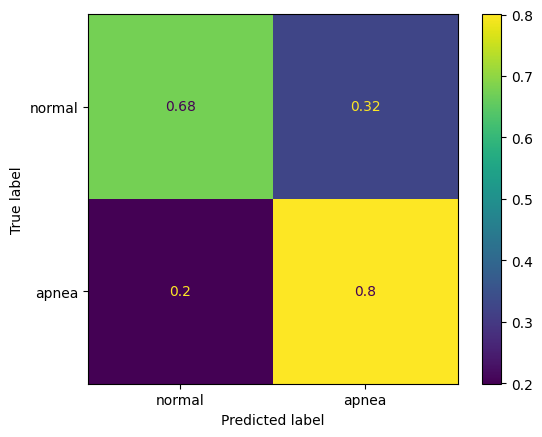

In [ ]:
# use the model to predict the test inputs
predictions = model.predict(model_test_in)

# A_acc = []
# N_acc = []

# print(len(predictions))
# for i in range(len(predictions)):
#     if model_test_out[i] == 1:
#         A_acc.append(predictions[i][0])
#     else:
#         # print(predictions[i][1])
#         N_acc.append(1-predictions[i])

# get predictions
# https://www.freecodecamp.org/news/binary-classification-made-simple-with-tensorflow/
predicted = tf.squeeze(predictions)
predicted = np.array([1 if x >= 0.5 else 0 for x in predicted])
# print(np.unique(predicted, return_counts=True))
actual = np.array(model_test_out)

# analyze model performance
# https://www.w3schools.com/python/python_ml_confusion_matrix.asp
print('Accuracy: ', accuracy_score(actual, predicted))
print('Precision: ', precision_score(actual, predicted))
print('F1 Score: ', f1_score(actual, predicted))
conf_mat = confusion_matrix(actual, predicted, normalize='true')
displ = ConfusionMatrixDisplay(confusion_matrix=conf_mat, display_labels = ['normal', 'apnea'])
displ.plot()

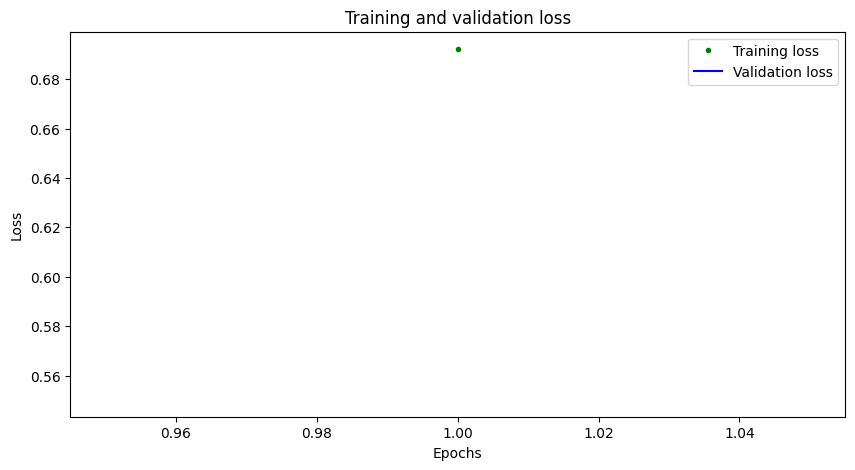

[10.0, 5.0]


In [ ]:
# increase the size of the graphs. The default size is (6,4).
plt.rcParams["figure.figsize"] = (10,5)

# graph the loss, the model above is configure to use "mean squared error" as the loss function
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'g.', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

print(plt.rcParams["figure.figsize"])

#### Convert Model to TensorFlow Lite

In [ ]:
# Convert the model to the TensorFlow Lite format without quantization
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model to disk
open("apnea_model2.tflite", "wb").write(tflite_model)

basic_model_size = os.path.getsize("apnea_model2.tflite")
print("Model is %d bytes" % basic_model_size)

Model is 3248 bytes


In [ ]:
!echo "const unsigned char model[] = {" > /content/model2.h
!cat apnea_model2.tflite | xxd -i        >> /content/model2.h
!echo "};"                              >> /content/model2.h

model_h_size = os.path.getsize("model2.h")
print(f"Header file, model.h, is {model_h_size:,} bytes.")
print("\nOpen the side panel (refresh if needed). Double click model.h to download the file.")

shutil.move('apnea_model2.tflite', model_dir + 'apnea_model2.tflite')
shutil.move('model2.h', model_dir + 'model2.h')

Header file, model.h, is 20,064 bytes.

Open the side panel (refresh if needed). Double click model.h to download the file.


'drive/MyDrive/EE400 Final Project/saved_models/model2.h'

### Single Patient

In [ ]:
# train the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.03)
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(22, activation='relu', input_shape=(11,)))
model.add(tf.keras.layers.Dense(11, activation='relu'))
model.add(tf.keras.layers.Dense(1, activation='sigmoid'))
model.compile(optimizer=optimizer,
              loss='binary_crossentropy',
              metrics=['accuracy'])

history = model.fit(model_train_in, model_train_out, epochs=16, batch_size=32, validation_data=(model_valid_in, model_valid_out))

3/3 [==============================] - 0s 4ms/step
96
Accuracy:  0.9270833333333334
Precision:  0.9305555555555556
F1 Score:  0.9503546099290779


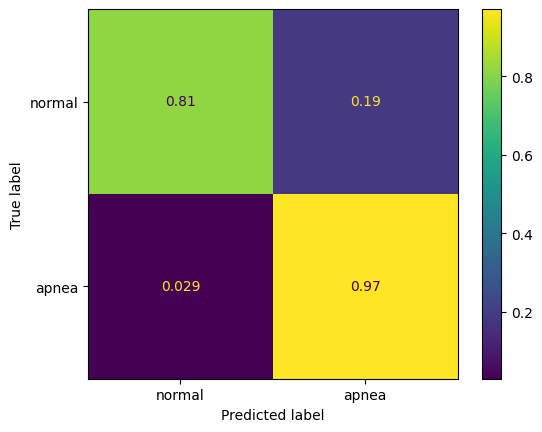

In [ ]:
# use the model to predict the test inputs
predictions = model.predict(model_test_in)

# A_acc = []
# N_acc = []

# print(len(predictions))
# for i in range(len(predictions)):
#     if model_test_out[i] == 1:
#         A_acc.append(predictions[i][0])
#     else:
#         # print(predictions[i][1])
#         N_acc.append(1-predictions[i])

# get predictions
# https://www.freecodecamp.org/news/binary-classification-made-simple-with-tensorflow/
predicted = tf.squeeze(predictions)
predicted = np.array([1 if x >= 0.5 else 0 for x in predicted])
# print(np.unique(predicted, return_counts=True))
actual = np.array(model_test_out)

# analyze model performance
# https://www.w3schools.com/python/python_ml_confusion_matrix.asp
print('Accuracy: ', accuracy_score(actual, predicted))
print('Precision: ', precision_score(actual, predicted))
print('F1 Score: ', f1_score(actual, predicted))
conf_mat = confusion_matrix(actual, predicted, normalize='true')
displ = ConfusionMatrixDisplay(confusion_matrix=conf_mat, display_labels = ['normal', 'apnea'])
displ.plot()

#### Convert Model to TensorFlow Lite

In [ ]:
# Convert the model to the TensorFlow Lite format without quantization
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model to disk
open("apnea_model_p15.tflite", "wb").write(tflite_model)

import os
basic_model_size = os.path.getsize("apnea_model_p15.tflite")
print("Model is %d bytes" % basic_model_size)

!echo "const unsigned char model[] = {" > /content/model_p15.h
!cat apnea_model_p15.tflite | xxd -i        >> /content/model_p15.h
!echo "};"                              >> /content/model_p15.h

model_h_size = os.path.getsize("model_p15.h")
print(f"Header file, model.h, is {model_h_size:,} bytes.")
print("\nOpen the side panel (refresh if needed). Double click model.h to download the file.")

shutil.move('apnea_model_p15.tflite', model_dir + 'apnea_model_p15.tflite')
shutil.move('model_p15.h', model_dir + 'model_p15.h')

Model is 4260 bytes
Header file, model.h, is 26,304 bytes.

Open the side panel (refresh if needed). Double click model.h to download the file.


'drive/MyDrive/EE400 Final Project/saved_models/model_p15.h'

In [ ]:
interpreter = tf.lite.Interpreter(model_path=model_dir + 'apnea_model_p15.tflite')
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

print(output_details)

[{'name': 'StatefulPartitionedCall:0', 'index': 10, 'shape': array([1, 1], dtype=int32), 'shape_signature': array([-1,  1], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]


#Application Testing

In [ ]:
apnea_samples = []
normal_samples = []

###
# CHOOSE PATIENTS THAT CAN BE SELECTED FOR TESTING
###
datasets = (3, 5)
select_prefixes = [data_path_prefixes[datasets[0]]]  if datasets[0] == datasets[1] else data_path_prefixes[datasets[0]:datasets[1]]

for data_file in select_prefixes:

    print(data_file)

    # get annotations
    recordname = data_file
    record = wfdb.rdsamp(recordname)
    ann = wfdb.rdann(recordname, extension="apn")
    ann_list = ann.symbol

    # open signal data file
    f = open(data_file + '.dat', 'rb')

    byte = f.read(2)
    raw_data = [byte]
    sample_count = 1 # 100 samples/sec
    minute = 0
    window_start = 0 # in minutes
    last_annotation = ann_list[0]

    while byte and minute < len(ann_list):
        byte = f.read(2)
        raw_data.append(byte)
        sample_count += 1

        # at the end of every minute
        if sample_count % (sr * 60) == 0:
            # process data
            data = [int.from_bytes(byte, 'little', signed=True) for byte in raw_data]
            data = np.array_split(data, 1)

            data = normalize(data)

            if data is not None:
                if last_annotation == 'A':
                    apnea_samples.append(data)
                elif last_annotation == 'N':
                    normal_samples.append(data)

            if minute < len(ann_list) - 1: last_annotation = ann_list[minute+1]
            raw_data.clear()
            minute += 1

drive/MyDrive/EE400 Final Project/apneaecg/a04
drive/MyDrive/EE400 Final Project/apneaecg/a05


In [ ]:
import time
from IPython.display import Audio, display

In [ ]:
# Normal Audio Sample
sample = normal_samples[random.randint(0, len(normal_samples)-1)][0]
sample = normalize(sample) ** 2 # emphasize peaks

sample = np.repeat([sample], 10, axis=0).flatten()
sample = np.repeat(sample, 3000 / sr)

display(Audio(sample, rate=3000, autoplay=True))

In [ ]:
# Apnea Audio Sample
sample = apnea_samples[random.randint(0, len(apnea_samples)-1)][0]
sample = normalize(sample) ** 2 # emphasize peaks

sample = np.repeat([sample], 10, axis=0).flatten()
sample = np.repeat(sample, 3000 / sr)

display(Audio(sample, rate=3000, autoplay=True))

#Logistic Regression from TensorFlow
https://www.tensorflow.org/guide/core/logistic_regression_core

In [ ]:
x_train, y_train = tf.convert_to_tensor(model_train_in, dtype=tf.float32), tf.convert_to_tensor(model_train_out, dtype=tf.float32)
x_test, y_test = tf.convert_to_tensor(model_test_in, dtype=tf.float32), tf.convert_to_tensor(model_test_out, dtype=tf.float32)

In [ ]:
class Normalize(tf.Module):
  def __init__(self, x):
    # Initialize the mean and standard deviation for normalization
    self.mean = tf.Variable(tf.math.reduce_mean(x, axis=0))
    self.std = tf.Variable(tf.math.reduce_std(x, axis=0))

  def norm(self, x):
    # Normalize the input
    return (x - self.mean)/self.std

  def unnorm(self, x):
    # Unnormalize the input
    return (x * self.std) + self.mean

norm_x = Normalize(x_train)
x_train_norm, x_test_norm = norm_x.norm(x_train), norm_x.norm(x_test)

In [ ]:
def log_loss(y_pred, y):
  # Compute the log loss function
  ce = tf.nn.sigmoid_cross_entropy_with_logits(labels=y, logits=y_pred)
  return tf.reduce_mean(ce)

def predict_class(y_pred, thresh=0.5):
  # Return a tensor with  `1` if `y_pred` > `0.5`, and `0` otherwise
  return tf.cast(y_pred > thresh, tf.float32)

def accuracy(y_pred, y):
  # Return the proportion of matches between `y_pred` and `y`
  y_pred = tf.math.sigmoid(y_pred)
  y_pred_class = predict_class(y_pred)
  check_equal = tf.cast(y_pred_class == y,tf.float32)
  acc_val = tf.reduce_mean(check_equal)
  return acc_val

class LogisticRegression(tf.Module):

    def __init__(self):
        self.built = False

    @tf.function
    def __call__(self, x, train=True):
        # Initialize the model parameters on the first call
        if not self.built:
            # Randomly generate the weights and the bias term
            rand_w = tf.random.uniform(shape=[x.shape[-1], 1], seed=22)
            rand_b = tf.random.uniform(shape=[], seed=22)
            self.w = tf.Variable(rand_w)
            self.b = tf.Variable(rand_b)
            self.built = True
        # Compute the model output
        z = tf.add(tf.matmul(x, self.w), self.b)
        z = tf.squeeze(z, axis=1)
        if train:
            return z
        return tf.sigmoid(z)

In [ ]:
log_reg = LogisticRegression()

batch_size = 128
train_dataset = tf.data.Dataset.from_tensor_slices((x_train_norm, y_train))
train_dataset = train_dataset.shuffle(buffer_size=x_train.shape[0]).batch(batch_size)
test_dataset = tf.data.Dataset.from_tensor_slices((x_test_norm, y_test))
test_dataset = test_dataset.shuffle(buffer_size=x_test.shape[0]).batch(batch_size)

# Set training parameters
epochs = 20
learning_rate = 0.01
train_losses, test_losses = [], []
train_accs, test_accs = [], []

# Set up the training loop and begin training
for epoch in range(epochs):
  batch_losses_train, batch_accs_train = [], []
  batch_losses_test, batch_accs_test = [], []

  # Iterate over the training data
  for x_batch, y_batch in train_dataset:
    with tf.GradientTape() as tape:
      y_pred_batch = log_reg(x_batch)
      batch_loss = log_loss(y_pred_batch, y_batch)
    batch_acc = accuracy(y_pred_batch, y_batch)
    # Update the parameters with respect to the gradient calculations
    grads = tape.gradient(batch_loss, log_reg.variables)
    for g,v in zip(grads, log_reg.variables):
      v.assign_sub(learning_rate * g)
    # Keep track of batch-level training performance
    batch_losses_train.append(batch_loss)
    batch_accs_train.append(batch_acc)

  # Iterate over the testing data
  for x_batch, y_batch in test_dataset:
    y_pred_batch = log_reg(x_batch)
    batch_loss = log_loss(y_pred_batch, y_batch)
    batch_acc = accuracy(y_pred_batch, y_batch)
    # Keep track of batch-level testing performance
    batch_losses_test.append(batch_loss)
    batch_accs_test.append(batch_acc)

  # Keep track of epoch-level model performance
  train_loss, train_acc = tf.reduce_mean(batch_losses_train), tf.reduce_mean(batch_accs_train)
  test_loss, test_acc = tf.reduce_mean(batch_losses_test), tf.reduce_mean(batch_accs_test)
  train_losses.append(train_loss)
  train_accs.append(train_acc)
  test_losses.append(test_loss)
  test_accs.append(test_acc)
  if epoch % 10 == 0:
    print(f"Epoch: {epoch}, Training log loss: {train_loss:.3f}, Testing log loss: {test_loss:.3f}")

In [ ]:
plt.plot(range(epochs), train_losses, label = "Training loss")
plt.plot(range(epochs), test_losses, label = "Testing loss")
plt.xlabel("Epoch")
plt.ylabel("Log loss")
plt.legend()
plt.title("Log loss vs training iterations");

In [ ]:
print(f"Final training log loss: {train_losses[-1]:.3f}")
print(f"Final testing log Loss: {test_losses[-1]:.3f}")

In [ ]:
print(f"Final training accuracy: {train_accs[-1]:.3f}")
print(f"Final testing accuracy: {test_accs[-1]:.3f}")

##Saving the Model (from TensorFlow)

In [ ]:
class ExportModule(tf.Module):
  def __init__(self, model, norm_x, class_pred):
    # Initialize pre- and post-processing functions
    self.model = model
    self.norm_x = norm_x
    self.class_pred = class_pred

  @tf.function(input_signature=[tf.TensorSpec(shape=[None, None], dtype=tf.float32)])
  def __call__(self, x):
    # Run the `ExportModule` for new data points
    x = self.norm_x.norm(x)
    y = self.model(x, train=False)
    y = self.class_pred(y)
    return y

In [ ]:
log_reg_export = ExportModule(model=log_reg,
                              norm_x=norm_x,
                              class_pred=predict_class)

In [ ]:
save_path = os.path.join(model_dir, 'log_reg_export')
# tf.saved_model.save(log_reg_export, save_path)

concrete_func = log_reg_export.__call__.get_concrete_function()
converter = tf.lite.TFLiteConverter.from_concrete_functions([concrete_func], log_reg_export)
tflite_model = converter.convert()

In [ ]:
converter = tf.lite.TFLiteConverter.from_saved_model(save_path)
converter.target_spec.supported_ops = [
  tf.lite.OpsSet.TFLITE_BUILTINS, # enable TensorFlow Lite ops.
]
tflite_model = converter.convert()

# From Lab 8
# Save the model to disk
open("apnea_model.tflite", "wb").write(tflite_model)

basic_model_size = os.path.getsize("apnea_model.tflite")
print("Model is %d bytes" % basic_model_size)

In [ ]:
!echo "const unsigned char model[] = {" > /content/model.h
!cat apnea_model.tflite | xxd -i        >> /content/model.h
!echo "};"                              >> /content/model.h

model_h_size = os.path.getsize("model.h")
print(f"Header file, model.h, is {model_h_size:,} bytes.")
print("\nOpen the side panel (refresh if needed). Double click model.h to download the file.")

# shutil.move('apnea_model.tflite', model_dir + 'apnea_model.tflite')
# shutil.move('model.h', model_dir + 'model.h')

#Testing / Scratchwork / Legacy

In [ ]:
# graph of mean absolute error
mae = history.history['mae']
val_mae = history.history['val_mae']
plt.plot(epochs[SKIP:], mae[SKIP:], 'g.', label='Training MAE')
plt.plot(epochs[SKIP:], val_mae[SKIP:], 'b.', label='Validation MAE')
plt.title('Training and validation mean absolute error')
plt.xlabel('Epochs')
plt.ylabel('MAE')
plt.legend()
plt.show()

In [ ]:
optimizer = tf.keras.optimizers.SGD(learning_rate=0.02)

model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(11, activation='relu')) # relu is used for performance
model.add(tf.keras.layers.Dense(11, activation='relu'))
model.add(tf.keras.layers.Dense(len(CLASSES), activation='softmax')) # softmax is used, because we only expect one gesture to occur per input
model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])
history = model.fit(model_train_in, model_train_out, epochs=100, batch_size=1, validation_data=(model_valid_in, model_valid_out))

In [ ]:
# graph the loss again skipping a bit of the start
SKIP = 100
plt.plot(epochs[SKIP:], loss[SKIP:], 'g.', label='Training loss')
plt.plot(epochs[SKIP:], val_loss[SKIP:], 'b.', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
np.unique(model_train_out, axis=0, return_counts=True)

In [ ]:
shutil.copy("/content/model.h", f"/content/{parent_dir}model.h")
shutil.copy("/content/gesture_model.tflite", f"/content/{parent_dir}gesture_model.tflite")

In [ ]:
print(peaks[0])
peak_times = peaks[0]/sr
rr_int = np.array([peak_times[i]-peak_times[i-1] for i in range(1, len(peak_times))])
print(peak_times)
print(rr_int)
print(np.mean(rr_int), np.std(rr_int), np.median(rr_int))
print(np.quantile(rr_int, 0.75), np.quantile(rr_int, 0.25), np.quantile(rr_int, 0.75)-np.quantile(rr_int, 0.25))

In [ ]:
print(np.array(data_samples).shape)
test = np.array(data_samples[4]).flatten()

avg = np.mean(test)
std = np.std(test)
q3 = np.quantile(test, 0.75)
peaks = sig.find_peaks(test, height=(avg+2*std), distance=int(sr*0.15))

fig = plt.figure(figsize=(15,5))
plt.plot(test)
plt.plot(peaks[0], peaks[1]['peak_heights'], 'o')

In [ ]:
feats = extract_features(peaks[0])
print(len(peaks[0]))
print('mean: ', feats[0])
print('std: ', feats[1])
print('median: ', feats[2])
print('iqr: ', feats[3])
print('nn50 1: ', feats[4], '; nn50 2: ', feats[5])
print('pnn50 1: ', feats[6], '; pnn50 2: ', feats[7])
print('sdsd: ', feats[8])
print('rmssd: ', feats[9])
print('mad: ', feats[10])

In [ ]:
start = 20

sample, fs = sf.read(f'./{target_dir}normal/sub1_0to12.wav')
sample *= np.iinfo(np.int16).max

t = np.arange(start, len(sample) / fs + start, 1/fs)

fill = np.repeat(sample, pr / sr)
display.display(Audio(data=fill, rate=pr))

plt.plot(t, sample)

In [ ]:
start = 13

window = 5
sample, fs = sf.read(f'./{target_dir}apnea/sub1_13to226.wav')
sample *= np.iinfo(np.int16).max

t = np.arange(start, start + window, 1/fs)

fill = np.repeat(sample[:window*fs], pr / sr)
display.display(Audio(data=fill, rate=pr))

plt.plot(t, sample[:window*fs])

In [ ]:
!zip -r /content/ecg_data_min.zip /content/ecg_data

In [ ]:
# https://www.tensorflow.org/guide/core/logistic_regression_core
# https://ieeexplore.ieee.org/document/6220730
# https://www.tensorflow.org/api_docs/python/tf/lite/TFLiteConverter

In [ ]:
recordname = data_path_prefixes[1]
record = wfdb.rdsamp(recordname)
ann = wfdb.rdann(recordname, extension="apn")
ann_list = ann.symbol
print(ann_list)
print(len(ann_list))

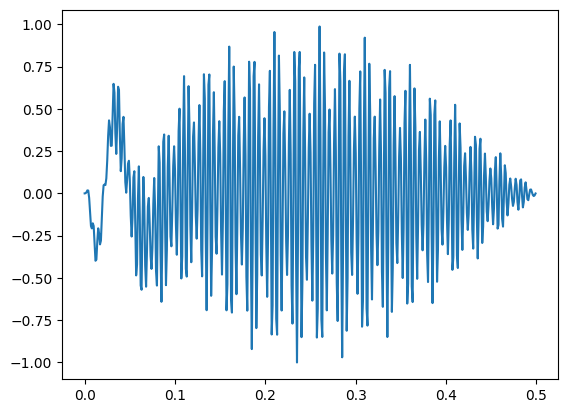

In [ ]:
test = [0, 0.000923472, 0.00663813, 0.0177474, 0.0167715, -0.0265521, -0.114127, -0.193282, -0.207089, -0.176868, -0.192817, -0.294709, -0.398454, -0.391544, -0.284778, -0.206624, -0.236173, -0.30154, -0.280009, -0.154247, -0.0179179, 0.0485362, 0.0522934, 0.049548, 0.0892809, 0.194792, 0.339811, 0.431854, 0.391049, 0.280735, 0.282361, 0.465918, 0.647855, 0.595541, 0.355477, 0.233411, 0.396706, 0.630539, 0.610783, 0.337295, 0.131318, 0.207095, 0.410667, 0.45266, 0.274043, 0.0667234, 0.00404925, 0.0779734, 0.175411, 0.193011, 0.0766089, -0.13044, -0.255202, -0.144131, 0.0938025, 0.131124, -0.166255, -0.485077, -0.418805, -0.0338659, 0.159908, -0.124799, -0.544765, -0.569929, -0.187587, 0.0971417, -0.0594591, -0.425226, -0.551732, -0.34047, -0.0778433, -0.0269228, -0.180121, -0.371354, -0.446483, -0.322747, -0.0603151, 0.0910315, -0.092652, -0.459801, -0.54519, -0.154016, 0.278506, 0.182077, -0.358367, -0.641176, -0.265828, 0.304881, 0.348396, -0.159842, -0.542882, -0.33562, 0.157652, 0.340826, 0.0786467, -0.254776, -0.312892, -0.102451, 0.16171, 0.278581, 0.138923, -0.181707, -0.36281, -0.115564, 0.369572, 0.50102, 0.0279876, -0.503162, -0.372516, 0.318451, 0.693425, 0.248402, -0.445782, -0.492008, 0.145385, 0.634141, 0.39908, -0.19101, -0.407154, -0.080808, 0.335296, 0.419546, 0.177574, -0.132429, -0.267626, -0.0950868, 0.296022, 0.522297, 0.23708, -0.335029, -0.490727, 0.0705446, 0.704684, 0.559851, -0.248473, -0.690915, -0.172421, 0.64217, 0.703256, -0.035062, -0.605718, -0.33762, 0.34503, 0.598343, 0.224647, -0.255843, -0.356821, -0.082648, 0.2715, 0.426963, 0.230407, -0.217566, -0.480066, -0.161116, 0.486101, 0.663891, 0.0293579, -0.691494, -0.535851, 0.369669, 0.868001, 0.287719, -0.628682, -0.704938, 0.113977, 0.750025, 0.452748, -0.308662, -0.596162, -0.187799, 0.341561, 0.452909, 0.149246, -0.244518, -0.420743, -0.20945, 0.279815, 0.567451, 0.217921, -0.493222, -0.693529, -0.00619155, 0.778769, 0.611285, -0.373996, -0.920799, -0.297849, 0.692996, 0.777781, -0.106287, -0.796734, -0.482207, 0.334671, 0.644805, 0.207429, -0.362085, -0.485295, -0.163768, 0.255861, 0.444545, 0.219854, -0.302421, -0.611773, -0.243832, 0.510271, 0.724811, -0.00165041, -0.83453, -0.662359, 0.375499, 0.954492, 0.301503, -0.741991, -0.835714, 0.0893459, 0.814901, 0.488683, -0.365633, -0.692749, -0.239017, 0.354839, 0.485186, 0.15211, -0.284558, -0.482474, -0.251247, 0.289933, 0.612225, 0.233854, -0.545638, -0.770049, -0.0231965, 0.836322, 0.663003, -0.402508, -1, -0.333551, 0.736459, 0.836435, -0.107158, -0.850219, -0.520552, 0.350008, 0.685942, 0.226965, -0.376625, -0.51087, -0.174378, 0.268688, 0.471111, 0.239225, -0.307317, -0.634361, -0.254596, 0.531402, 0.760497, 0.0120065, -0.852598, -0.681988, 0.38537, 0.987101, 0.324072, -0.745621, -0.848885, 0.0905233, 0.833325, 0.508869, -0.355946, -0.691864, -0.238372, 0.360669, 0.496091, 0.16506, -0.272898, -0.474243, -0.246806, 0.292246, 0.616596, 0.245395, -0.527148, -0.754678, -0.0223757, 0.826629, 0.66353, -0.378797, -0.969354, -0.325482, 0.71814, 0.82273, -0.0887877, -0.812469, -0.50065, 0.337681, 0.665862, 0.229565, -0.349641, -0.482379, -0.164438, 0.258139, 0.453953, 0.23706, -0.280741, -0.593932, -0.239966, 0.50056, 0.721375, 0.0237344, -0.788332, -0.636336, 0.355709, 0.920958, 0.312493, -0.678973, -0.781937, 0.0796146, 0.766717, 0.475562, -0.315302, -0.627332, -0.218651, 0.326772, 0.453862, 0.157138, -0.239367, -0.424549, -0.223271, 0.260791, 0.555365, 0.227594, -0.462443, -0.670877, -0.0248557, 0.73049, 0.593545, -0.323593, -0.849425, -0.291166, 0.623907, 0.722878, -0.0673305, -0.700779, -0.43731, 0.286756, 0.575089, 0.204215, -0.293871, -0.412065, -0.143752, 0.217023, 0.387115, 0.206503, -0.231811, -0.50043, -0.206845, 0.415788, 0.606778, 0.0283486, -0.651616, -0.533037, 0.286663, 0.760178, 0.265916, -0.550191, -0.642695, 0.056746, 0.620973, 0.391703, -0.247713, -0.505229, -0.181278, 0.25722, 0.36362, 0.130332, -0.185824, -0.336633, -0.181134, 0.200636, 0.436681, 0.184506, -0.3554, -0.524254, -0.0276719, 0.560154, 0.462845, -0.23925, -0.648808, -0.230735, 0.46629, 0.550025, -0.0414504, -0.522588, -0.33319, 0.205803, 0.426131, 0.15705, -0.211095, -0.303112, -0.110627, 0.153092, 0.280871, 0.154279, -0.161584, -0.359279, -0.154759, 0.289089, 0.431612, 0.0290661, -0.452185, -0.378581, 0.188583, 0.524061, 0.19243, -0.368388, -0.441332, 0.0275747, 0.413737, 0.268835, -0.156503, -0.334259, -0.126713, 0.161974, 0.237304, 0.0903219, -0.114505, -0.216147, -0.121617, 0.120522, 0.274961, 0.123094, -0.213804, -0.326524, -0.0279643, 0.334826, 0.286703, -0.131603, -0.384775, -0.147788, 0.262978, 0.3233, -0.0115257, -0.293238, -0.196433, 0.104743, 0.235516, 0.0945821, -0.10757, -0.16439, -0.0665612, 0.0742994, 0.147271, 0.0871013, -0.075381, -0.18279, -0.0873447, 0.134279, 0.214393, 0.0271434, -0.208279, -0.186848, 0.072271, 0.236878, 0.100347, -0.150279, -0.196518, -0.00404104, 0.166261, 0.119914, -0.0497069, -0.130299, -0.0594699, 0.0511493, 0.0880378, 0.0417514, -0.0316945, -0.0742183, -0.0499099, 0.0288961, 0.0866125, 0.0499202, -0.0509909, -0.0965426, -0.0252308, 0.0770111, 0.0827831, -0.0107853, -0.0827901, -0.0500904, 0.0342082, 0.0652121, 0.019809, -0.0349035, -0.0401692, -0.00629282, 0.0221214, 0.0231286, 0.00675443, -0.00930701, -0.0157138, -0.0115023, -0.000484074]

freq = 1000

t = np.arange(0, len(test)/freq, 1/freq)
plt.plot(t, test)

In [ ]:
print(type(16) == 'int')

False


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as sig

In [ ]:
test = [0.00, 0.00, -10793.37, -7309.84, -995.82, 658.44, 1125.37, 1263.90, 1311.01, 1336.79, 1339.98, 1318.00, 1293.73, 1264.35, 1231.47, 1186.36, 1156.50, 1125.78, 1077.40, 1025.52, 984.92, 947.05, 904.53, 869.99, 830.55, 780.83, 726.34, 695.74, 670.15, 629.07, 580.47, 545.22, 516.23, 487.99, 461.45, 433.04, 399.63, 364.26, 342.06, 325.33, 301.56, 272.31, 242.49, 226.19, 193.43, 1437.12, 2599.88, 2929.94, 3033.15, 2944.29, 2564.80, 2343.45, 2170.92, 1903.97, 1647.60, 1440.82, 1257.39, 1088.70, 941.01, 799.15, 665.53, 552.11, 464.79, 379.99, 283.66, 208.06, 136.71, 77.01, 17.83, -26.04, -66.97, -118.57, -167.44, -195.93, -214.19, -245.15, -276.89, -301.25, -326.85, -347.44, -356.97, -369.89, -382.11, -404.78, -416.33, -415.32, -428.73, -442.59, -458.07, -461.05, -462.53, -460.61, -459.39, -467.44, -483.04, -483.01, -468.59, -467.38, -471.64, -472.67, -465.34, -464.32, -470.15, -460.93, -451.12, -448.75, -460.32, -451.73, -442.07, -440.50, -442.40, -433.75, -422.56, -434.27, -433.31, -423.21, -407.12, -416.13, -419.82, -400.99, -389.62, -391.43, -384.28, -377.24, -376.30, -380.62, -368.01, -350.56, -349.38, -361.23, -358.02, -342.08, -336.71, -339.21, -332.98, -320.86, -323.24, -313.96, -307.92, -307.22, 277.79, 923.47, 1163.57, 1386.91, 1418.84, 1165.61, 1063.50, 997.89, 834.13, 672.46, 558.33, 460.23, 359.17, 271.81, 210.51, 147.16, 88.63, 39.61, -1.06, -49.56, -81.75, -100.15, -120.52, -155.78, -185.53, -199.54, -215.82, -234.16, -240.87, -250.07, -272.77, -290.39, -288.58, -282.83, -292.06, -304.15, -305.55, -302.10, -307.33, -312.39, -311.34, -319.43, -336.55, -340.68, -325.75, -316.84, -322.27, -325.10, -321.99, -325.79, -325.95, -316.89, -306.35, -309.88, -322.11, -316.72, -301.76, -295.12, -298.82, -296.68, -296.16, -302.87, -298.42, -283.69, -270.27, -274.62, -282.49, -277.57, -265.76, -259.87, -251.63, -253.43, -257.65, -262.47, -243.15, -228.62, -234.98, -240.30, -235.52, -226.78, -226.19, -219.22, -218.29, -222.62, -216.08, -201.61, -186.73, -195.28, -210.24, -197.92, -193.43, -199.93, -190.12, -177.89, -189.35, -192.12, 32.50, 293.82, 267.41, 615.27, 815.32, 670.95, 633.06, 618.60, 539.26, 479.90, 374.54, 294.48, 247.09, 212.89, 162.15, 111.97, 90.00, 65.73, 28.76, -5.95, -13.57, -29.83, -49.68, -68.89, -79.59, -89.76, -102.84, -111.30, -109.56, -125.06, -137.15, -147.66, -143.37, -152.19, -160.39, -162.37, -155.26, -167.20, -163.26, -171.41, -183.99, -181.72, -190.28, -177.17, -164.15, -176.93, -193.67, -200.75, -203.21, -200.02, -188.63, -179.05, -184.32, -187.11, -180.20, -174.74, -178.73, -177.42, -170.27, -164.76, -168.73, -172.73, -156.25, -155.30, -163.42, -161.58, -149.00, -154.31, -163.94, -154.88, -149.66, -134.75, -143.28, -143.07, -133.91, -142.32, -148.90, -133.81, -121.82, -128.78, -141.08, -139.50, -125.47, -130.42, -120.24, -107.16, -110.07, -129.74, -130.70, -110.45, -93.42, -107.51, -119.26, -112.24, -106.75, -126.66, -271.80, -511.65, 54.72, 472.89, 457.80, 357.82, 400.44, 394.04, 346.22, 269.44, 206.91, 184.22, 168.12, 138.45, 104.73, 81.42, 72.00, 55.31, 36.87, 21.80, 9.06, -11.47, -23.25, -21.54, -25.68, -47.16, -62.21, -53.71, -47.86, -57.83, -64.79, -65.71, -65.17, -71.11, -58.13, -56.51, -57.64, -76.12, -79.06, -75.22, -81.88, -94.87, -91.93, -85.16, -94.90, -94.22, -77.36, -74.81, -85.57, -91.21, -81.19, -71.18, -83.94, -82.47, -77.56, -81.69, -92.54, -84.55, -70.48, -73.91, -77.77, -65.05, -49.08, -55.09, -73.23, -77.61, -72.60, -80.49, -81.63, -78.12, -67.41, -64.06, -64.02, -55.66, -56.68, -62.99, -57.69, -56.41, -61.41, -64.13, -51.90, -45.91, -59.63, -65.98, -55.38, -45.23, -44.30, -45.59, -43.63, -47.70, -54.76, -45.84, -33.82, -36.23, -45.92, -51.29, -35.90, -35.22, 277.47, -479.16, -922.79, -253.91, 170.81, 131.51, 184.22, 250.81, 209.23, 167.34, 134.46, 101.49, 75.33, 63.70, 48.76, 20.12, 4.86, 8.00, 2.69, -12.25, -20.40, -11.75, -17.25, -26.92, -23.95, -20.19, -29.91, -42.11, -35.96, -26.89, -34.56, -41.72, -41.17, -36.49, -42.95, -40.71, -27.28, -24.79, -34.05, -38.56, -27.52, -30.92, -34.77, -31.91, -25.15, -34.14, -37.07, -20.33, -17.80, -32.36, -40.43, -21.90, -13.63, -23.01, -31.35, -29.57, -27.62, -29.43, -22.28, -16.76, -28.32, -40.97, -25.06, -6.81, -13.78, -29.12, -30.55, -21.03, -23.28, -17.76, -7.32, -10.11, -24.44, -27.14, -10.35, -6.29, -22.00, -25.79, -18.36, -14.30, -14.83, -13.44, -13.11, -20.61, -26.22, -19.23, -12.23, -18.88, -26.56, -18.55, -16.62, -18.42, -10.52, -8.61, -9.66, -12.19, -2.19, 3.26, 0.03, -18.20, -731.84, -1112.75, -544.79, -120.92, -106.57, -70.49, 5.74, 8.21, -20.01, -37.45, -46.97, -52.30, -43.73, -56.07, -77.26, -79.34, -58.60, -52.84, -69.65, -67.64, -48.95, -38.37, -44.16, -37.97, -23.58, -33.00, -41.34, -24.40, -6.65, -16.02, -24.35, -15.74, -6.08, -13.60, 4.30, 22.28, 10.69, 0.31, 13.73, 36.69, 30.10, 18.65, 19.67, 24.47, 37.01, 37.76, 44.77, 39.63, 33.08, 34.54, 42.47, 51.98, 39.86, 32.38, 35.13, 39.58, 38.38, 41.88, 47.28, 39.48, 31.53, 40.99, 56.17, 51.49, 42.02, 42.76, 52.80, 55.23, 54.30, 64.69, 50.51, 25.85, 20.65, 38.36, 41.88, 35.14, 37.31, 50.73, 50.93, 37.33, 36.32, 46.70, 41.62, 27.50, 30.15, 41.42, 36.55, 28.55, 33.44, 36.90, 36.98, 29.41, 37.44, 39.38, 33.02, 32.25, 35.85, 26.10, 7.82, 81.54, 84.92, 615.21, 978.39, 897.69, 702.22, 689.16, 673.11, 607.79, 509.34, 419.57, 367.56, 311.76, 277.81, 236.23, 189.03, 174.59, 145.32, 107.15, 87.31, 77.21, 66.43, 51.69, 41.31, 35.01, 13.76, -0.47, -4.66, -2.64, -26.43, -54.93, -45.88, -55.83, -40.03, -30.90, -52.22, -72.53, -63.03, -72.87, -84.35, -69.67, -81.30, -97.76, -93.39, -81.72, -83.45, -74.01, -80.07, -87.60, -93.21, -83.95, -71.85, -75.00, -84.86, -88.00, -81.93, -80.47, -79.35, -77.57, -80.93, -88.57, -85.10, -76.68, -74.65, -80.22, -75.50, -70.57, -71.65, -73.43, -71.59, -64.31, -73.18, -77.59, -65.77, -59.12, -68.13, -71.82, -65.89, -59.90, -66.05, -63.74, -69.25, -80.44, -88.45, -69.14, -53.86, -57.76, -67.80, -67.19, -54.91, -58.77, -58.94, -52.16, -52.04, -61.11, -62.54, -49.24, -39.95, -47.57, -76.72, -1098.70, -1214.98, -341.15, 287.04, 302.18, 253.50, 290.29, 297.66, 266.06, 200.78, 149.37, 122.54, 103.17, 78.01, 54.49, 44.26, 30.41, 8.10, -2.60, -1.39, -1.85, -17.14, -30.69, -24.86, -18.14, -23.34, -26.12, -23.75, -31.53, -37.20, -37.05, -22.60, -25.18, -37.94, -34.95, -26.64, -28.43, -28.10, -16.65, -25.26, -39.47, -42.91, -27.81, -21.13, -30.13, -38.38, -32.78, -31.43, -33.38, -25.51, -21.33, -24.87, -31.04, -17.36, -8.74, -11.21, -20.91, -26.29, -22.28, -22.83, -23.72, -13.31, -15.35, -22.67, -29.75, -18.56, -13.58, -13.90, -14.73, -12.66, -20.50, -27.71, -18.83, -10.61, -23.80, -32.30, -29.80, -17.06, -19.29, -25.14, -23.52, -20.85, -17.17, -17.04, -2.60, -7.45, -22.28, -21.31, -9.70, -2.34, -6.63, -15.26, -21.89, -28.80, -23.64, -16.33, -11.53, -24.02, -35.38, -25.23, -18.23, 157.93, -885.02, -942.65, -138.86, 288.10, 209.89, 241.83, 295.82, 240.58, 174.91, 142.36, 119.33, 89.50, 66.36, 46.37, 24.09, 8.85, 8.21, 5.77, -13.78, -24.57, -21.86, -21.97, -26.54, -26.89, -15.60, -16.66, -29.05, -32.05, -22.91, -28.29, -37.93, -25.85, -24.45, -19.56, -25.20, -22.77, -5.50, -21.05, -19.49, -10.78, -9.43, -17.45, -20.14, -22.31, -14.49, -8.81, -4.40, -0.30, -5.38, -18.75, -13.63, 0.50, 6.19, -4.57, -15.52, -10.57, -7.10, -3.99, 1.31, 0.32, -8.27, -11.86, -5.14, 4.07, 4.78, -1.88, -5.76, -1.39, -4.13, -3.27, 2.24, -7.80, -12.50, -7.57, -1.83, 2.59, -1.65, -3.43, -9.93, -10.74, -0.32, 9.03, 2.18, -13.89, -16.25, -8.47, -5.84, -9.75, -8.42, 1.00, -8.86, -14.28, -3.45, -6.14, -13.62, -16.94, -9.40, -2.27, -2.07, -3.53, 12.04, -1081.81, -1025.82, -199.90, 319.63, 266.05, 232.64, 270.84, 270.20, 234.40, 167.34, 132.95, 114.78, 80.05, 61.81, 64.23, 48.13, 24.52, 5.16, 0.49, 7.70, -1.93, -11.84, -13.48, -14.63, -27.05, -24.74, -9.77, -16.77, -29.08, -32.05, -19.12, -9.93, -19.08, -12.19, -15.08, -24.12, -14.17, 4.92, 1.95, -14.70, -32.37, -24.50, -15.02, -12.73, -6.11, -6.78, -8.47, -14.18, 0.37, 0.85, -10.42, -13.13, -10.00, -0.90, -7.80, -10.99, -5.69, -6.68, -15.27, -12.03, 1.65, -4.15, -15.42, -15.86, -5.35, -5.08, -14.12, -4.17, -0.25, -12.20, -15.08, -3.64, 1.40, -8.77, -18.05, -6.63, -3.88, -1.69, -2.68, -2.17, -11.14, -14.07, -7.19, 5.85, 5.96, -7.66, -9.44, -3.04, 0.03, -4.55, -4.13, -6.31, -9.87, -9.97, 0.63, 25.18, -676.61, -332.53, 370.29, 744.79, 626.62, 571.53, 586.30, 533.73, 457.32, 382.74, 325.29, 275.76, 224.36, 193.75, 165.11, 136.20, 114.05, 95.05, 66.95, 45.75, 42.15, 44.31, 28.90, 9.25, 2.99, -1.55, -17.82, -23.27, -20.03, -25.32, -44.80, -54.05, -41.12, -37.24, -49.19, -51.32, -39.70, -40.69, -53.82, -56.23, -48.47, -61.01, -70.10, -60.92, -51.88, -58.04, -68.63, -62.84, -55.38, -58.88, -64.28, -57.24, -64.64, -70.22, -67.02, -52.59, -55.94, -72.67, -77.47, -61.94, -61.23, -67.12, -64.75, -56.60, -55.39, -64.20, -65.56, -60.58, -65.45, -65.11, -58.20, -63.36, -68.40, -64.30, -57.25, -54.78, -59.50, -55.33, -50.53, -53.16, -58.35, -58.84, -57.44, -65.45, -57.52, -43.47, -44.63, -59.32, -65.15, -55.93, -43.09, -46.06, -43.74, -40.14, -46.86, -69.72, -154.13, -57.70, 401.75, 653.02, 546.81, 441.52, 460.09, 438.78, 367.64, 298.13, 241.90, 205.57, 186.17, 162.53, 127.23, 95.20, 74.57, 58.21, 42.12, 33.69, 20.27, 1.86, -17.76, -24.01, -20.21, -25.36, -37.22, -40.09, -44.57, -45.66, -51.99, -45.93, -55.84, -71.89, -69.70, -55.51, -56.64, -71.33, -67.29, -67.83, -80.10, -83.82, -71.06, -71.01, -84.66, -87.95, -72.06, -62.15, -74.17, -80.87, -72.62, -74.43, -74.10, -68.72, -58.31, -68.69, -79.55, -69.27, -53.14, -56.83, -68.34, -65.05, -58.94, -60.50, -64.67, -50.51, -48.61, -61.80, -66.50, -53.98, -49.45, -57.45, -61.66, -58.13, -58.03, -64.83, -52.82, -49.92, -56.81, -64.54, -63.37, -54.75, -54.94, -48.92, -44.43, -53.21, -61.39, -48.20, -45.01, -54.11, -46.44, -52.93, -46.16, -63.48, 500.48, 918.08, 1218.40, 1388.77, 1305.50, 1022.94, 928.17, 855.22, 726.10, 613.76, 501.68, 410.90, 363.19, 316.77, 244.12, 178.80, 155.44, 142.21, 110.19, 62.26, 35.51, 14.64, -8.60, -21.04, -24.80, -46.95, -80.36, -96.78, -89.36, -98.19, -125.35, -121.29, -131.69, -149.37, -140.75, -149.28, -145.28, -141.27, -160.79, -176.12, -171.48, -173.39, -179.16, -177.52, -174.09, -174.02, -178.56, -176.62, -182.22, -185.85, -183.69, -175.58, -172.86, -176.00, -175.24, -172.78, -167.64, -157.29, -147.21, -147.81, -157.06, -163.08, -158.47, -153.56, -155.41, -158.13, -153.48, -154.63, -161.74, -155.87, -130.94, -146.91, -149.25, -137.68, -122.75, -132.80, -131.43, -110.62, -99.53, -108.99, -110.51, -95.71, -91.38, -100.95, -97.20, -97.81, -96.44, -102.17, -117.21, -99.60, -101.42, 180.32, -73.28, -148.16, 382.94, 699.30, 564.81, 529.30, 545.00, 468.39, 397.55, 321.28, 259.62, 211.36, 178.47, 146.25, 105.86, 80.18, 55.77, 35.46, 14.63, 8.08, -4.12, -22.23, -37.23, -40.09, -40.02, -52.90, -65.87, -72.04, -78.08, -84.85, -85.72, -92.00, -102.62, -106.70, -97.83, -82.79, -89.02, -101.90, -105.77, -106.70, -110.72, -104.86, -96.62, -102.98, -115.89, -112.18, -101.42, -102.62, -112.01, -112.76, -114.46, -115.63, -114.39, -98.92, -92.91, -108.91, -112.77, -102.32, -90.70, -98.51, -104.19, -102.53, -101.37, -98.05, -90.43, -88.59, -92.69, -106.58, -93.24, -88.51, -85.09, -91.09, -87.99, -92.55, -93.65, -87.85, -81.89, -82.73, -98.11, -94.23, -82.68, -76.10, -78.30, -83.38, -80.82, -84.75, -75.84, -69.89, -62.39, -79.54, -82.16, -88.11, -951.25, -809.21, -57.33, 392.74, 320.12, 269.21, 327.46, 309.66, 245.44, 174.56, 141.52, 124.44, 93.76, 70.43, 57.21, 38.85, 13.93, 1.85, 3.48, -2.19, -21.01, -33.14, -26.97, -27.75, -34.77, -34.94, -38.78, -45.02, -48.04, -41.94, -37.43, -40.14, -41.55, -41.13, -46.34, -43.81, -34.85, -29.65, -39.78, -52.84, -55.24, -48.99, -41.41, -38.82, -38.96, -47.33, -59.22, -45.40, -32.96, -37.54, -54.58, -53.38, -45.51, -44.36, -42.57, -38.35, -37.32, -46.18, -46.80, -31.02, -25.70, -38.82, -43.51, -38.57, -34.35, -40.15, -37.76, -34.91, -38.01, -50.14, -47.76, -29.74, -37.52, -47.75, -41.87, -30.59, -29.38, -37.44, -31.80, -32.71, -36.72, -36.93, -27.12, -24.75, -37.08, -43.85, -32.58, -26.07, -29.81, -31.47, -29.60, -23.83, -30.79, 508.38, 1000.39, 1278.48, 1473.82, 1426.93, 1109.15, 992.98, 937.62, 789.23, 644.17, 537.09, 467.23, 392.72, 326.94, 270.85, 233.04, 186.74, 132.32, 104.77, 82.95, 60.99, 23.07, 1.02, -11.13, -24.69, -46.92, -54.57, -66.27, -85.03, -102.45, -106.66, -99.33, -109.70, -134.96, -146.37, -141.54, -149.47, -138.49, -131.29, -161.41, -180.06, -181.53, -171.27, -162.72, -172.79, -177.50, -171.81, -171.95, -175.78, -175.95, -177.50, -180.16, -184.59, -179.59, -175.35, -170.53, -171.65, -171.91, -169.70, -169.93, -166.19, -165.29, -168.10, -167.27, -161.00, -151.90, -160.32, -166.15, -161.48, -153.53, -149.34, -152.12, -144.44, -150.18, -155.35, -143.71, -127.24, -134.64, -146.29, -142.28, -132.21, -128.26, -126.54, -125.37, -125.85, -128.24, -128.82, -119.09, -100.06, -112.91, -125.11, -121.99, -35.52, -727.68, -718.06, -42.91, 326.43, 235.84, 201.83, 261.12, 232.96, 189.75, 131.53, 89.41, 73.93, 55.02, 45.90, 21.70, -9.17, -23.45, -29.94, -33.02, -42.87, -52.07, -58.09, -67.12, -62.48, -59.84, -57.69, -70.82, -79.30, -79.07, -76.74, -69.35, -75.15, -72.00, -81.10, -73.44, -64.76, -74.05, -42.15, -62.52, -83.36, -81.57, -72.79, -59.30, -56.04, -59.80, -63.74, -66.21, -52.40, -49.82, -62.09, -65.06, -60.46, -60.11, -60.03, -57.73, -55.66, -65.78, -69.74, -60.08, -46.36, -49.88, -46.18, -49.08, -45.98, -44.48, -40.32, -36.29, -40.62, -49.25, -61.20, -46.64, -37.05, -44.60, -46.42, -45.34, -57.98, -43.58, -31.00, -28.73, -37.28, -43.14, -35.45, -30.56, -32.41, -32.86, -33.72, -27.87, -33.28, -26.24, -17.71, -27.03, 604.86, 1125.33, 1379.95, 1597.69, 1559.24, 1219.23, 1093.14, 1012.63, 862.72, 725.63, 591.65, 490.27, 414.21, 352.61, 294.50, 235.71, 188.90, 157.88, 116.25, 73.58, 48.87, 30.00, 2.69, -35.00, -49.41, -57.44, -73.04, -92.73, -103.55, -111.48, -124.77, -134.05, -128.70, -131.20, -149.25, -155.13, -153.51, -152.37, -158.16, -170.17, -182.18, -197.21, -196.29, -183.93, -174.88, -184.83, -196.34, -197.60, -192.59, -185.32, -182.04, -182.01, -193.38, -197.64, -188.05, -176.63, -173.12, -179.86, -186.03, -184.49, -181.08, -166.61, -160.08, -172.91, -185.12, -186.55, -165.65, -159.85, -166.79, -168.47, -157.49, -159.39, -158.34, -148.98, -140.65, -143.95, -150.81, -143.37, -136.26, -140.61, -146.22, -136.19, -132.25, -129.79, -126.91, -123.19, -126.08, -133.60, -129.35, -106.33, -99.25, -114.99, -119.55, -123.68, -783.10, -695.03, -2.45, 401.44, 314.63, 269.40, 325.23, 315.95, 242.41, 167.00, 132.87, 109.45, 85.59, 65.42, 46.14, 17.97, -1.73, -14.07, -17.81, -22.51, -36.53, -44.47, -52.46, -61.97, -61.99, -56.69, -61.48, -68.70, -70.44, -70.87, -70.21, -68.53, -71.92, -72.74, -73.70, -78.48, -69.01, -65.21, -75.67, -75.92, -69.15, -72.07, -81.88, -76.66, -65.54, -66.65, -75.26, -70.51, -59.50, -62.91, -71.32, -67.29, -56.45, -62.18, -59.77, -54.63, -51.88, -62.59, -59.11, -43.86, -47.00, -56.86, -61.52, -52.78, -49.91, -52.25, -50.54, -51.65, -56.47, -58.39, -45.96, -40.68, -46.23, -52.12, -43.69, -43.92, -50.81, -44.13, -41.00, -45.55, -52.72, -46.86, -31.80, -25.12, -35.65, -42.74, -38.39, -36.58, -38.41, -26.72, -26.93, -36.84, -38.48, -25.22, 43.97, -917.84, -833.01, -96.45, 278.61, 206.84, 206.20, 266.73, 239.63, 176.19, 133.57, 114.93, 92.23, 60.95, 40.51, 35.57, 19.21, 0.09, 0.02, 3.80, -8.94, -23.40, -17.03, -13.97, -23.85, -33.07, -24.67, -23.40, -26.89, -26.21, -23.78, -26.98, -34.58, -28.83, -26.68, -28.44, -19.00, -4.59, -0.35, -20.57, -33.79, -24.85, -17.38, -18.61, -22.70, -15.34, -11.29, -11.83, -13.48, -14.63, -19.46, -21.39, -19.58, -9.28, -17.41, -15.58, -12.86, -8.42, -11.89, -13.49, -7.81, -9.47, -15.18, -18.84, -11.38, -11.09, -16.33, -18.36, -14.29, -10.28, -22.20, -12.19, -9.77, -17.53, -23.95, -17.92, -11.15, -14.07, -15.53, -19.68, -19.92, -13.15, -9.24, -17.40, -23.17, -20.01, -13.17, -6.97, -13.06, -26.67, -7.96, -12.54, 582.57, 1093.40, 1329.76, 1527.16, 1494.42, 1168.69, 1051.35, 988.88, 837.26, 705.08, 578.34, 484.78, 411.37, 354.96, 289.00, 226.80, 179.92, 148.12, 120.72, 87.56, 52.24, 25.51, 6.16, -17.48, -26.98, -41.41, -60.06, -88.84, -96.55, -95.37, -102.68, -127.95, -140.13, -137.75, -144.01, -146.28, -146.07, -136.91, -156.70, -187.27, -181.76, -164.49, -169.43, -182.00, -182.76, -175.36, -184.95, -184.23, -172.68, -175.20, -190.98, -197.82, -175.20, -168.22, -176.40, -183.68, -176.34, -174.56, -182.48, -169.98, -163.17, -168.35, -177.95, -171.92, -161.36, -160.33, -159.32, -157.56, -157.89, -165.56, -154.52, -147.30, -144.04, -150.84, -147.17, -137.94, -137.99, -137.24, -132.51, -135.16, -137.31, -131.01, -127.97, -127.99, -134.83, -126.61, -112.49, -113.64, -116.95, -110.16, -98.66, -120.92, -967.52, -803.28, -14.18, 460.05, 397.05, 343.16, 387.79, 367.47, 310.22, 247.09, 196.96, 159.82, 128.86, 113.04, 94.80, 57.78, 34.43, 31.07, 21.16, 3.59, -4.44, -12.45, -29.56, -42.03, -33.66, -29.37, -43.50, -58.29, -59.59, -48.52, -54.19, -59.36, -64.40, -65.61, -67.42, -64.07, -54.16, -53.28, -60.65, -66.98, -70.03, -69.25, -66.03, -66.01, -66.00, -69.03, -68.25, -61.99, -54.41, -64.72, -62.66, -55.33, -60.39, -63.89, -60.18, -49.42, -54.41, -64.72, -59.62, -50.81, -56.26, -63.65, -59.36, -51.50, -56.43, -65.97, -56.89, -46.35, -52.91, -59.81, -49.33, -43.01, -52.86, -54.48, -50.32, -49.32, -55.15, -51.24, -41.20, -47.87, -58.59, -54.35, -43.46, -39.32, -49.70, -45.38, -41.30, -41.83, -44.99, -42.72, -27.00, -37.62, -44.74, -37.35, -24.95, -34.85, 271.49, 547.23, 999.15, 1259.98, 1118.90, 886.10, 828.38, 758.30, 635.95, 536.62, 463.33, 399.36, 333.09, 277.65, 226.33, 187.39, 162.82, 130.34, 89.12, 55.65, 41.50, 26.71, 10.24, -9.66, -24.33, -41.53, -54.78, -59.50, -61.40, -82.33, -94.98, -98.79, -96.67, -102.99, -110.58, -117.73, -113.38, -122.95, -119.95, -115.44, -131.04, -147.70, -146.41, -135.48, -135.12, -145.65, -142.12, -142.79, -143.71, -145.45, -141.32, -138.80, -145.02, -145.76, -139.12, -139.79, -146.02, -143.73, -136.35, -136.08, -146.64, -144.64, -138.84, -134.41, -137.13, -134.76, -137.98, -142.55, -136.82, -130.13, -126.24, -132.13, -135.06, -130.46, -124.04, -130.84, -117.31, -123.90, -127.77, -135.53, -123.75, -116.35, -111.53, -119.47, -120.63, -117.88, -114.94, -105.12, -104.27, -107.86, -111.76, -106.63, -106.15, -35.49, -949.17, -879.25, -82.59, 369.19, 288.64, 271.47, 329.52, 298.03, 238.84, 178.28, 156.07, 118.09, 87.68, 67.44, 53.45, 28.84, 13.79, 13.19, -9.71, -24.34, -27.12, -23.24, -27.61, -39.28, -59.55, -55.34, -56.60, -55.39, -55.09, -64.13, -67.82, -68.72, -76.52, -67.78, -37.61, -59.90, -87.28, -74.17, -60.39, -69.95, -73.78, -75.46, -78.15, -78.79, -62.26, -60.55, -63.92, -70.81, -71.71, -69.65, -63.09, -55.44, -58.14, -67.89, -68.73, -56.80, -54.68, -60.99, -64.03, -60.97, -61.75, -63.46, -63.11, -58.48, -53.56, -65.27, -52.17, -41.42, -49.45, -51.38, -48.82, -48.20, -45.77, -48.98, -42.17, -42.04, -49.60, -52.18, -46.73, -35.56, -39.69, -42.20, -43.57, -40.10, -42.30, -38.28, -33.52, -36.16, -42.87, -36.14, -26.93, -24.71, -29.48, 317.54, 194.25, 228.95, 718.25, 966.86, 772.78, 700.88, 707.04, 641.02, 556.81, 455.31, 387.56, 345.42, 288.21, 244.81, 219.92, 193.43, 151.38, 109.37, 90.13, 78.65, 56.92, 38.02, 22.07, 5.33, -18.44, -18.86, -18.97, -32.65, -56.43, -62.93, -58.43, -61.90, -77.15, -84.62, -78.84, -82.00, -90.34, -87.05, -90.05, -112.01, -117.31, -106.46, -97.01, -100.79, -110.81, -114.75, -111.15, -113.31, -108.52, -105.09, -112.61, -126.56, -118.55, -104.48, -101.84, -109.55, -110.65, -110.92, -114.77, -106.60, -94.77, -99.50, -111.26, -108.79, -103.64, -94.05, -96.29, -91.52, -88.09, -97.12, -101.58, -91.28, -80.45, -88.45, -94.18, -92.53, -88.33, -88.08, -89.54, -70.92, -81.60, -97.07, -90.19, -73.36, -69.29, -78.93, -78.23, -69.71, -73.72, -81.52, -74.30, -61.18, -64.84, -74.82, -62.82, -50.06, -65.94, -911.77, -764.03, -64.63, 323.47, 251.81, 243.61, 303.07, 266.61, 204.70, 170.79, 145.16, 108.63, 76.29, 63.93, 51.85, 33.00, 18.59, 9.80, -5.98, -14.34, -11.81, -11.95, -21.85, -37.89, -36.46, -39.14, -36.76, -33.91, -29.43, -37.45, -51.52, -50.37, -40.99, -35.69, -43.51, -44.64, -39.60, -42.94, -50.57, -43.31, -42.32, -48.90, -50.49, -41.78, -32.08, -36.57, -43.72, -39.38, -35.30, -46.45, -47.63, -35.01, -31.21, -36.36, -46.71, -36.31, -39.11, -41.30, -41.07, -32.67, -34.44, -41.69, -38.13, -31.96, -30.47, -43.77, -40.15, -31.69, -31.93, -41.84, -43.48, -34.77, -36.46, -36.11, -31.48, -28.84, -40.34, -43.87, -32.59, -24.56, -30.96, -40.85, -34.14, -37.83, -34.17, -24.18, -22.53, -35.02, -47.14, -43.24, -24.85, -30.27, -37.65, -37.92, -40.26, -46.13, -369.17, -304.57, 166.92, 425.65, 349.30, 294.46, 324.45, 322.59, 280.42, 223.97, 174.69, 140.79, 133.36, 120.95, 83.06, 54.95, 44.37, 44.09, 32.64, 10.16, 11.56, 11.13, -9.45, -16.69, -6.31, -3.80, -24.43, -33.97, -24.13, -14.93, -36.22, -40.60, -35.59, -40.45, -38.59, -30.56, -33.93, -30.95, -48.43, -53.41, -40.96, -44.03, -52.35, -47.53, -38.03, -39.52, -40.64, -31.81, -33.47, -49.04, -49.01, -36.87, -30.90, -39.32, -41.35, -33.50, -37.67, -41.71, -35.86, -20.04, -31.39, -38.68, -30.58, -28.62, -29.67, -29.92, -23.15, -26.83, -34.54, -28.82, -22.89, -20.70, -30.03, -29.25, -22.99, -25.27, -20.51, -17.85, -17.20, -27.67, -30.20, -19.43, -9.24, -12.09, -21.88, -19.70, -19.17, -27.38, -24.06, -10.36, -4.78, -31.50, -32.64, -8.64, -3.60, -531.85, -542.58, 98.83, 503.26, 440.10, 370.24, 412.54, 394.68, 346.38, 275.55, 242.51, 220.13, 169.97, 147.24, 132.64, 108.64, 83.12, 76.20, 57.84, 39.00, 24.59, 27.93, 26.47, 6.39, -4.53, -6.40, -13.68, -14.68, -17.20, -12.50, -33.36, -36.12, -34.51, -34.12, -25.69, -31.23, -25.75, -28.21, -40.19, -48.39, -42.78, -44.46, -55.49, -53.60, -45.56, -45.14, -45.03, -44.25, -46.34, -58.22, -59.57, -42.45, -41.35, -53.98, -63.10, -54.68, -46.58, -46.14, -45.28, -42.03, -51.87, -64.86, -52.07, -39.12, -42.82, -53.58, -51.62, -48.12, -47.27, -47.07, -46.26, -43.79, -49.26, -44.51, -41.09, -37.23, -40.85, -44.76, -39.63, -42.19, -35.98, -34.48, -33.36, -36.88, -35.45, -30.56, -27.86, -33.28, -42.17, -39.77, -32.36, -32.84, -36.00, -29.17, -50.28, -571.19, -552.84, 105.46, 554.93, 498.09, 397.89, 430.59, 429.38, 366.89, 307.05, 262.26, 211.24, 173.89, 160.32, 141.87, 114.66, 89.89, 78.59, 56.15, 37.83, 31.13, 33.31, 19.42, -2.90, -3.73, -2.42, -3.62, -20.60, -19.39, -19.09, -31.16, -35.59, -23.01, -16.17, -35.76, -46.56, -37.03, -23.35, -34.46, -44.73, -45.69, -57.30, -60.11, -51.68, -39.03, -44.32, -56.21, -55.29, -48.24, -40.47, -49.98, -50.75, -53.97, -52.48, -44.53, -41.85, -45.00, -51.83, -48.17, -41.97, -41.99, -46.55, -45.37, -45.09, -54.12, -59.34, -49.98, -39.38, -44.40, -50.17, -45.49, -46.64, -52.22, -37.64, -25.78, -37.32, -47.70, -45.65, -35.30, -38.86, -48.83, -45.92, -48.26, -58.68, -52.85, -32.48, -32.88, -45.11, -54.89, -40.56, -34.07, -40.08, -34.71, -35.69, -42.75, -55.08, -45.92, -31.57, 571.91, 1084.76, 1332.23, 1523.97, 1460.27, 1132.37, 1027.41, 964.14, 802.46, 659.51, 572.65, 491.75, 405.47, 339.12, 285.93, 232.13, 187.28, 149.90, 113.57, 68.38, 28.65, 19.81, 16.92, 1.05, -42.98, -80.16, -106.59, -92.49, -62.53, -68.20, -113.56, -176.09, -175.26, -129.55, -104.86, -126.21, -175.36, -200.88, -191.11, -153.86, -122.87, -152.55, -215.85, -237.20, -196.09, -143.68, -138.61, -173.04, -208.66, -214.23, -195.09, -160.89, -154.15, -184.38, -213.67, -207.85, -176.86, -158.00, -170.90, -189.18, -191.32, -183.49, -164.91, -153.60, -163.76, -180.63, -186.22, -164.06, -148.84, -152.00, -161.10, -165.58, -156.04, -145.39, -135.99, -134.48, -146.25, -150.61, -134.22, -125.71, -124.41, -127.13, -133.10, -137.58, -133.35, -107.29, -95.69, -114.89, -140.01, -130.90, -107.46, -101.80, -105.74, -108.97, -108.23, -120.19, 250.88, 601.42, 978.10, 1144.90, 986.44, 766.13, 728.10, 681.75, 569.68, 474.34, 380.78, 306.61, 270.50, 235.23, 177.41, 130.83, 96.06, 74.78, 58.26, 30.75, 5.15, -10.89, -33.73, -54.42, -55.62, -57.42, -79.86, -105.76, -102.15, -105.07, -117.15, -129.93, -122.40, -151.68, -145.85, -127.00, -131.55, -134.17, -146.94, -153.81, -160.02, -162.28, -156.76, -150.11, -150.03, -162.90, -169.80, -157.06, -153.22, -158.36, -164.16, -154.94, -155.74, -159.73, -153.87, -146.38, -150.64, -161.53, -149.75, -141.60, -141.14, -159.24, -152.99, -143.89, -143.97, -142.48, -142.87, -135.38, -143.44, -157.52, -132.85, -124.62, -134.01, -128.69, -122.86, -128.28, -120.48, -113.29, -113.83, -107.89, -122.39, -125.13, -103.03, -104.53, -114.75, -108.87, -105.93, -107.50, -107.88, -99.63, -91.57, -96.45, -95.35, -74.60, -97.66, -90.33, 504.62, 975.21, 1231.44, 1461.70, 1479.38, 1158.23, 1028.34, 949.19, 801.13, 669.80, 525.83, 441.76, 373.67, 288.96, 227.55, 187.69, 149.24, 98.24, 54.82, 29.92, 11.02, -18.58, -42.41, -51.96, -70.95, -97.54, -113.06, -112.26, -121.16, -141.52, -154.78, -154.95, -165.61, -176.52, -170.06, -160.91, -175.39, -187.99, -184.96, -180.44, -190.73, -204.59, -204.90, -201.94, -200.47, -200.87, -193.38, -195.37, -207.23, -210.85, -195.03, -188.18, -192.60, -192.14, -192.03, -190.49, -193.15, -182.42, -176.03, -179.80, -188.30, -178.97, -169.89, -166.94, -169.26, -169.82, -174.51, -167.30, -155.69, -147.58, -153.21, -168.22, -165.02, -151.35, -141.22, -144.09, -144.78, -143.43, -149.93, -140.12, -126.38, -117.75, -132.35, -138.15, -125.90, -116.11, -125.13, -125.79, -114.57, -117.17, -126.90, -123.18, -107.87, -108.73, -118.04, -108.15, -94.38, -95.61, -105.77, 525.93, 752.79, 850.04, 1160.26, 1250.33, 980.80, 864.13, 819.28, 693.91, 558.20, 459.44, 385.53, 320.65, 259.47, 199.95, 157.51, 119.20, 79.60, 40.46, 11.29, -4.86, -26.96, -37.61, -59.15, -81.79, -98.64, -104.22, -99.50, -114.29, -136.07, -145.88, -146.73, -154.52, -156.40, -158.37, -167.95, -182.40, -177.55, -162.72, -164.45, -189.14, -201.17, -190.42, -184.79, -184.19, -181.01, -174.93, -186.36, -194.43, -188.79, -175.30, -177.35, -183.91, -178.67, -178.16, -187.14, -184.76, -166.74, -161.63, -173.29, -183.69, -173.31, -160.18, -163.08, -160.74, -157.15, -162.34, -165.88, -159.14, -141.59, -147.21, -161.46, -158.08, -148.16, -138.94, -139.74, -133.11, -133.79, -146.84, -141.65, -124.47, -120.32, -129.18, -135.87, -129.90, -122.39, -124.37, -126.36, -119.26, -118.30, -121.11, -112.68, -99.27, -111.96, -120.33, -107.19, -94.15, -91.76, -98.01, -98.00, -432.52, -381.30, 182.53, 528.78, 428.82, 351.58, 386.03, 366.29, 297.04, 225.71, 187.24, 161.27, 120.10, 89.68, 73.99, 61.10, 32.20, 7.77, -1.16, -1.04, -11.63, -26.32, -30.63, -41.53, -50.23, -59.92, -56.95, -52.44, -71.83, -70.44, -73.90, -73.22, -73.81, -74.71, -69.62, -85.84, -85.20, -72.15, -72.04, -75.80, -90.36, -102.22, -95.99, -91.45, -83.52, -77.06, -85.36, -86.60, -82.35, -72.98, -75.27, -78.86, -83.52, -80.85, -84.76, -78.11, -69.68, -69.92, -80.60, -84.70, -69.76, -65.39, -71.92, -80.32, -75.53, -69.82, -72.99, -62.38, -53.75, -63.80, -77.61, -71.84, -53.00, -55.27, -60.38, -60.85, -61.72, -61.17, -63.32, -53.97, -47.93, -66.19, -71.36, -59.71, -35.66, -50.33, -66.77, -56.32, -49.25, -54.37, -50.30, -22.76, -41.91, -61.70, -39.17, -573.06, -529.78, -19.44, 253.21, 196.16, 152.80, 180.26, 196.75, 177.22, 117.89, 63.36, 63.09, 50.88, 22.91, 7.81, 1.88, -3.34, -9.91, -18.32, -16.56, -27.51, -43.05, -34.67, -25.82, -28.99, -40.38, -41.61, -35.08, -38.81, -46.54, -38.54, -34.34, -49.25, -28.58, -19.04, -47.08, -16.68, -19.96, -37.44, -35.59, -39.69, -34.62, -22.77, -25.98, -35.10, -27.44, -17.24, -20.85, -25.52, -20.57, -18.62, -21.18, -23.32, -8.66, -10.44, -23.00, -27.55, -16.51, -16.12, -18.31, -19.59, -16.87, -23.79, -20.92, -5.05, -5.77, -16.56, -17.65, -10.33, -13.11, -11.51, -1.26, -3.34, -19.77, -16.91, -12.43, -3.76, -6.98, -22.92, -23.74, -11.80, -20.30, -15.52, -4.51, -7.16, -19.93, -23.02, -2.52, 0.15, -8.31, -11.11, -6.47, -9.15, -23.45, 301.55, 586.35, 1020.73, 1391.86, 1373.76, 1097.07, 1005.23, 939.06, 810.06, 678.79, 562.13, 483.14, 427.66, 364.96, 296.72, 241.56, 211.55, 177.76, 130.15, 92.87, 80.83, 55.17, 20.91, 5.05, 5.01, -14.72, -47.55, -60.03, -54.70, -64.79, -83.91, -87.01, -99.14, -113.45, -119.18, -110.70, -105.62, -124.87, -139.38, -139.09, -134.47, -148.53, -155.71, -148.35, -145.05, -150.32, -151.59, -151.90, -155.01, -163.35, -156.26, -149.99, -154.55, -163.99, -157.93, -150.40, -156.92, -153.95, -147.92, -145.70, -160.34, -155.53, -140.72, -140.17, -153.70, -156.96, -145.61, -142.11, -146.58, -140.83, -135.65, -149.57, -154.45, -141.21, -121.33, -132.46, -142.73, -134.59, -128.83, -131.24, -130.30, -117.94, -117.98, -124.82, -129.51, -118.50, -106.74, -116.80, -116.95, -110.16, -110.80, -122.33, -105.39, -94.47, -95.63, -108.81, -105.92, -99.91, -406.43, -341.63, 211.07, 557.67, 469.17, 380.29, 421.79, 402.99, 321.07, 244.40, 209.20, 183.26, 147.41, 117.52, 89.82, 61.13, 43.59, 42.38, 25.40, -2.21, -20.26, -20.06, -18.50, -32.53, -41.23, -47.12, -59.17, -71.94, -60.61, -51.04, -63.91, -79.91, -84.53, -72.75, -74.46, -80.18, -68.66, -71.95, -83.37, -90.67, -81.06, -81.01, -96.93, -100.02, -86.35, -82.29, -88.90, -87.46, -78.01, -81.79, -95.60, -82.25, -68.41, -81.75, -94.08, -79.61, -71.56, -74.93, -80.29, -74.00, -68.69, -81.06, -75.71, -69.10, -67.51, -74.71, -72.65, -61.54, -59.61, -65.97, -65.24, -64.30, -72.42, -70.58, -56.49, -50.81, -60.06, -69.12, -61.44, -57.31, -62.39, -61.33, -51.98, -59.58, -65.21, -58.22, -42.12, -48.10, -64.71, -56.59, -39.45, -33.80, -42.30, -32.21, -33.57, -53.62, 529.41, 1000.16, 1287.53, 1496.49, 1471.09, 1169.12, 1043.11, 970.96, 828.38, 683.97, 579.31, 481.22, 403.68, 355.38, 294.41, 223.55, 172.31, 134.91, 104.64, 71.54, 40.03, 22.56, -8.21, -36.12, -38.30, -43.38, -66.61, -91.94, -110.19, -98.67, -117.12, -137.51, -129.54, -156.44, -137.90, -137.98, -169.85, -166.17, -174.39, -170.30, -176.90, -185.32, -188.87, -181.38, -178.82, -186.54, -189.16, -186.01, -180.69, -189.27, -181.48, -176.56, -182.20, -185.08, -179.71, -166.28, -172.89, -174.49, -168.81, -167.44, -167.86, -167.21, -159.46, -156.08, -162.09, -162.02, -144.56, -140.34, -157.53, -155.61, -139.22, -140.57, -158.34, -142.91, -127.81, -139.33, -147.42, -131.93, -122.88, -116.90, -132.15, -126.73, -114.04, -122.35, -124.36, -108.92, -93.81, -103.06, -122.74, -106.25, -95.44, -67.80, -1078.34, -921.82, -152.79, 273.35, 213.16, 200.14, 243.27, 212.72, 190.18, 142.25, 84.41, 69.69, 40.34, 9.74, 11.45, -9.37, -27.29, -39.21, -43.60, -53.01, -49.21, -54.36, -74.57, -77.93, -68.12, -61.96, -65.78, -66.71, -70.72, -73.97, -86.13, -71.62, -55.22, -76.29, -85.17, -65.32, -52.94, -69.67, -72.20, -62.94, -66.02, -73.59, -70.11, -45.75, -52.77, -68.11, -62.72, -50.80, -48.67, -62.58, -57.59, -51.07, -57.84, -66.31, -54.70, -39.76, -53.59, -58.45, -51.28, -40.45, -46.94, -53.05, -42.39, -43.61, -46.94, -51.54, -38.99, -40.52, -49.99, -43.17, -36.97, -33.96, -40.06, -36.98, -37.75, -44.01, -35.66, -26.06, -23.74, -41.38, -42.61, -33.80, -30.92, -30.98, -27.96, -26.47, -35.98, -45.86, -33.07, -24.67, -29.47, -32.15, -19.90, -21.49, -32.50, -32.12, -22.93, -21.47, -32.49, -32.88, -16.28, -13.79, -28.36, -161.59, -44.33, 401.19, 630.89, 533.12, 441.24, 438.02, 430.42, 389.14, 311.66, 253.51, 222.02, 191.66, 165.37, 137.02, 103.63, 90.26, 79.44, 53.32, 31.84, 27.41, 27.10, 14.89, 5.87, -2.38, -10.43, -18.45, -15.83, -11.41, -36.13, -37.55, -41.68, -46.47, -46.87, -40.14, -51.41, -48.07, -30.57, -53.65, -49.36, -53.64, -67.57, -67.90, -52.80, -54.47, -57.91, -56.46, -55.35, -66.46, -78.25, -59.85, -53.90, -57.77, -75.39, -65.99, -58.41, -59.62, -61.42, -56.55, -59.17, -76.49, -71.57, -59.00, -58.24, -69.44, -73.66, -60.26, -57.79, -59.47, -57.60, -61.70, -71.79, -69.67, -61.58, -50.52, -50.13, -68.99, -64.45, -58.04, -64.08, -52.64, -42.29, -48.14, -67.00, -68.52, -47.64, -52.47, -55.15, -54.28, -50.27, -50.07, -65.19, 332.43, 637.04, 1071.66, 1329.06, 1206.13, 936.75, 872.46, 819.77, 707.68, 588.83, 472.14, 413.63, 363.85, 303.28, 236.32, 195.87, 166.39, 128.92, 94.09, 63.68, 44.20, 19.02, 0.80, -6.63, -26.63, -56.49, -73.57, -62.52, -71.99, -93.24, -112.02, -108.21, -111.84, -122.58, -117.59, -108.80, -121.09, -144.54, -147.16, -138.70, -148.03, -163.18, -160.01, -150.14, -156.86, -159.24, -148.44, -143.55, -159.82, -166.78, -154.81, -145.09, -157.16, -160.07, -150.91, -148.70, -155.76, -149.11, -137.65, -139.43, -144.41, -149.41, -135.45, -131.31, -139.42, -139.10, -136.75, -135.42, -132.83, -124.61, -119.60, -125.21, -129.60, -119.28, -106.93, -116.09, -113.75, -110.90, -115.53, -113.61, -104.80, -99.64, -103.71, -113.79, -104.09, -94.16, -97.83, -104.79, -99.64, -90.81, -87.16, -88.56, -79.03, -94.94, -943.80, -808.17, -22.19, 448.25, 371.45, 324.84, 378.06, 356.02, 280.91, 214.98, 185.41, 151.72, 104.90, 78.43, 70.52, 48.13, 25.27, 11.41, 3.51, -13.56, -28.31, -25.04, -22.73, -44.18, -56.18, -56.04, -50.70, -58.51, -66.47, -66.11, -67.54, -69.41, -69.86, -62.38, -67.40, -77.72, -74.90, -63.60, -60.87, -72.35, -74.36, -80.16, -83.07, -76.95, -67.13, -64.00, -76.89, -76.22, -70.74, -67.90, -67.22, -68.57, -68.14, -74.86, -72.69, -63.82, -56.37, -68.23, -80.19, -70.19, -66.25, -64.54, -58.82, -52.89, -59.80, -75.88, -67.63, -46.67, -46.16, -64.24, -71.64, -55.98, -53.72, -60.00, -57.72, -51.11, -59.37, -65.92, -54.60, -39.73, -49.80, -67.40, -58.75, -44.53, -41.85, -46.52, -43.85, -45.48, -58.77, -55.91, -34.74, -30.39, -49.82, -50.71, -4.66, -876.49, -732.75, -43.42, 302.80, 216.48, 215.36, 279.56, 259.41, 191.59, 142.60, 117.11, 96.55, 70.34, 52.64, 46.84, 24.21, 6.60, 0.08, 4.57, -2.69, -22.65, -29.74, -20.84, -29.30, -35.14, -30.48, -30.12, -42.16, -48.11, -29.82, -20.85, -34.62, -39.46, -36.08, -34.50, -25.78, -14.57, -17.93, -21.02, -36.93, -46.09, -24.78, -15.84, -28.86, -28.97, -19.13, -21.31, -25.63, -19.08, -14.47, -27.01, -33.07, -18.60, -12.84, -20.55, -30.75, -20.32, -14.01, -18.55, -21.93, -15.91, -15.98, -27.37, -22.54, -19.10, -11.44, -17.93, -24.81, -14.33, -13.32, -16.87, -21.52, -16.57, -24.48, -22.60, -10.01, -16.83, -22.27, -23.58, -21.62, -12.05, -10.49, -11.64, -16.46, -24.46, -35.49, -22.98, -0.24, -11.44, -23.24, -6.37, -27.33, -822.80, -700.07, -38.56, 334.31, 270.36, 234.43, 293.27, 287.00, 243.00, 185.35, 153.23, 136.37, 101.20, 93.46, 86.28, 59.52, 37.13, 32.48, 32.12, 17.62, 5.77, 5.19, 9.60, -7.54, -14.72, -4.31, -12.42, -20.45, -19.35, -6.95, -9.26, -24.99, -22.72, -13.83, -7.89, -22.39, -9.20, 9.16, -15.99, -38.00, -21.31, -9.70, -20.55, -25.44, -15.25, -16.58, -26.00, -14.62, -2.77, -12.81, -28.12, -25.00, -2.24, -0.54, -18.34, -16.56, -13.86, -13.21, -14.57, -4.28, -1.03, -16.18, -25.15, -12.90, 0.68, -8.18, -10.32, -5.53, -8.92, -18.84, -15.17, 0.13, -3.00, -14.38, -14.85, -4.34, -7.12, -17.65, -8.81, 3.18, -4.54, -13.99, -8.69, -5.13, -14.89, -11.94, -3.64, 2.15, -11.62, -6.60, -19.80, -404.53, -387.44, 372.20, 958.40, 895.90, 715.44, 714.35, 709.53, 621.14, 512.56, 440.07, 392.23, 337.44, 293.11, 263.44, 230.49, 185.36, 153.99, 137.31, 115.84, 86.38, 73.95, 58.82, 36.96, 12.72, 9.14, 14.34, -2.61, -15.80, -22.78, -27.50, -44.57, -46.41, -41.55, -43.41, -60.55, -64.68, -51.27, -61.68, -81.65, -85.71, -78.34, -77.32, -83.91, -74.12, -77.06, -89.91, -99.08, -89.92, -77.08, -86.12, -96.65, -92.36, -89.05, -91.29, -92.59, -87.59, -91.69, -101.79, -97.40, -86.48, -84.60, -90.97, -90.99, -89.48, -86.84, -90.00, -82.41, -84.38, -87.12, -96.13, -85.41, -79.03, -82.80, -84.47, -86.39, -81.54, -82.65, -79.12, -74.48, -80.94, -83.26, -75.48, -64.50, -70.95, -74.78, -76.46, -64.73, -71.76, -69.67, -60.06, -60.77, -76.87, -72.42, 381.51, 290.10, 299.88, 694.42, 846.57, 642.85, 600.48, 622.11, 538.59, 425.12, 349.17, 311.87, 277.08, 232.26, 181.24, 144.65, 109.26, 83.27, 64.10, 53.41, 30.34, 2.77, -14.50, -18.67, -21.20, -33.94, -45.36, -53.43, -65.24, -72.64, -79.74, -73.87, -87.62, -95.49, -93.60, -91.63, -97.22, -97.81, -94.92, -105.60, -120.32, -120.83, -122.48, -124.39, -130.92, -121.12, -114.20, -122.39, -128.16, -119.70, -115.38, -121.92, -121.98, -114.41, -114.10, -125.40, -119.03, -110.66, -117.75, -124.77, -122.67, -106.99, -115.34, -125.70, -115.31, -101.42, -111.72, -122.55, -113.79, -103.33, -100.80, -104.75, -99.63, -99.15, -111.17, -104.21, -91.16, -88.00, -103.93, -103.98, -91.10, -91.78, -100.29, -90.97, -81.13, -93.93, -93.22, -84.71, -78.10, -86.37, -86.85, -77.86, -65.83, -75.82, -77.47, -798.49, -662.34, -59.80, 242.71, 180.73, 158.18, 198.25, 191.23, 157.68, 102.55, 63.45, 53.25, 40.16, 16.52, 1.71, 0.41, -10.52, -32.88, -42.83, -36.13, -34.51, -44.74, -48.73, -49.69, -56.75, -63.01, -57.69, -46.55, -52.96, -65.89, -56.11, -49.20, -56.63, -58.43, -52.79, -43.09, -49.85, -43.14, -38.48, -43.43, -56.00, -55.24, -45.96, -41.44, -44.14, -41.00, -32.66, -37.47, -46.97, -38.65, -23.74, -30.01, -37.59, -38.66, -33.61, -35.42, -38.14, -30.45, -32.38, -39.68, -34.61, -25.05, -22.74, -32.80, -26.88, -27.73, -21.87, -23.48, -22.36, -14.50, -28.53, -28.13, -20.45, -18.59, -19.66, -25.23, -19.75, -22.21, -28.88, -25.94, -18.40, -13.55, -26.03, -25.25, -18.23, -15.02, -21.07, -19.50, -18.36, -10.50, -13.91, -22.32, 560.49, 987.18, 1262.40, 1504.83, 1492.82, 1174.37, 1045.14, 992.69, 880.66, 728.45, 595.36, 512.41, 443.07, 357.30, 304.73, 260.18, 206.19, 149.91, 118.12, 98.31, 64.70, 41.41, 22.89, 5.53, -27.49, -48.36, -53.40, -62.96, -78.92, -93.39, -99.92, -117.43, -131.52, -132.64, -122.29, -129.66, -145.85, -139.14, -148.89, -159.59, -165.97, -162.20, -168.88, -181.11, -177.99, -165.86, -167.48, -181.53, -182.64, -173.05, -169.22, -175.88, -169.14, -162.21, -171.91, -175.77, -167.60, -154.25, -164.68, -176.30, -165.45, -158.28, -160.34, -164.63, -156.57, -152.34, -156.63, -151.60, -145.08, -148.05, -157.87, -154.18, -144.18, -137.98, -137.99, -140.27, -144.62, -144.15, -138.73, -126.04, -125.25, -133.40, -134.61, -122.77, -116.88, -123.04, -119.98, -114.68, -114.92, -117.26, -106.44, -106.87, 495.32, 980.55, 1253.97, 1489.14, 1429.11, 1095.27, 979.01, 907.70, 755.46, 610.99, 509.35, 427.16, 342.84, 273.93, 226.95, 174.65, 124.09, 86.10, 60.99, 19.28, -18.10, -33.20, -36.84, -63.51, -100.29, -116.76, -115.42, -125.72, -138.83, -145.03, -154.11, -172.23, -182.68, -174.58, -176.42, -189.00, -191.27, -191.07, -187.22, -204.50, -210.95, -206.44, -209.14, -212.07, -210.50, -204.05, -209.32, -211.35, -207.29, -201.00, -202.52, -202.88, -199.94, -199.98, -203.03, -193.90, -184.87, -188.00, -194.83, -192.68, -180.79, -177.91, -178.74, -177.42, -174.07, -177.05, -172.46, -159.22, -159.81, -169.06, -170.53, -157.23, -149.47, -152.91, -153.74, -144.08, -143.26, -155.20, -146.70, -131.00, -129.48, -140.49, -137.84, -127.34, -124.05, -130.08, -119.40, -114.55, -127.03, -133.07, -125.43, -99.31, -105.14, -118.69, -109.82, -100.10, -27.20, -894.07, -746.10, -13.27, 326.76, 226.06, 254.08, 316.98, 265.41, 192.28, 146.55, 119.58, 85.77, 71.53, 58.99, 30.93, 4.43, 0.31, -5.23, -20.99, -36.17, -43.63, -41.63, -51.01, -55.55, -52.86, -55.24, -65.68, -67.44, -59.52, -56.09, -62.09, -68.09, -59.68, -67.51, -66.36, -59.26, -49.20, -56.63, -63.74, -59.39, -56.82, -63.02, -71.35, -58.19, -50.46, -57.70, -57.17, -48.70, -51.20, -64.70, -55.07, -42.88, -44.49, -56.25, -56.06, -42.36, -48.91, -52.77, -44.60, -34.28, -43.17, -51.39, -47.30, -33.42, -35.38, -47.23, -40.23, -42.33, -40.56, -39.38, -32.26, -38.13, -42.58, -44.42, -28.17, -25.01, -32.59, -34.42, -38.65, -41.19, -33.46, -23.25, -24.58, -37.79, -38.71, -33.62, -25.56, -26.65, -28.43, -26.59, -35.24, 304.01, 672.66, 976.34, 1287.09, 1374.25, 1097.95, 964.48, 918.60, 790.71, 673.36, 563.10, 461.38, 398.13, 351.76, 290.50, 229.44, 178.28, 143.18, 121.80, 88.58, 54.00, 32.00, 9.24, -11.42, -21.72, -29.52, -54.16, -79.07, -89.64, -82.33, -97.25, -111.47, -121.73, -131.80, -139.54, -147.47, -125.12, -126.55, -151.92, -167.15, -170.07, -171.53, -168.09, -172.57, -170.62, -169.39, -172.13, -172.03, -175.04, -175.01, -178.04, -178.01, -174.97, -176.51, -176.12, -174.51, -168.81, -173.51, -167.81, -163.40, -163.86, -163.21, -161.53, -152.78, -157.50, -160.15, -156.24, -146.20, -148.32, -158.70, -158.17, -145.90, -145.98, -149.03, -143.70, -144.69, -142.65, -140.64, -134.09, -135.54, -139.68, -139.16, -120.08, -121.54, -134.78, -135.71, -126.83, -110.27, -112.34, -117.39, -101.17, -131.38, 115.44, 406.39, 835.43, 1121.83, 1024.87, 786.03, 733.67, 725.58, 621.98, 492.28, 410.15, 344.04, 280.29, 248.21, 202.54, 144.48, 102.40, 79.34, 60.12, 28.17, 8.32, -14.68, -35.40, -48.75, -57.28, -65.41, -83.30, -99.76, -103.74, -105.45, -114.21, -129.98, -136.82, -137.72, -144.76, -138.87, -135.18, -145.66, -161.85, -165.00, -162.72, -173.55, -176.17, -166.94, -160.92, -167.81, -174.78, -168.88, -162.14, -172.65, -174.43, -161.21, -161.05, -168.60, -171.18, -160.42, -157.83, -171.61, -167.36, -157.98, -152.69, -158.99, -156.72, -152.38, -149.82, -152.99, -143.89, -135.63, -140.46, -147.70, -141.86, -130.59, -127.87, -131.76, -133.46, -130.08, -127.74, -124.90, -119.67, -118.40, -124.17, -124.04, -109.60, -99.28, -107.41, -113.17, -109.25, -99.96, -96.96, -94.71, -89.62, -92.94, -92.99, -107.41, -532.64, -443.41, 243.39, 733.11, 677.65, 532.28, 544.20, 528.12, 449.90, 367.29, 312.46, 272.67, 229.68, 188.20, 157.71, 128.35, 93.95, 77.30, 60.38, 44.16, 19.01, 4.59, 1.87, -7.89, -22.39, -34.23, -35.57, -40.45, -53.76, -63.80, -57.88, -67.07, -85.22, -87.33, -77.98, -81.79, -88.78, -85.91, -87.50, -93.95, -103.85, -99.41, -90.76, -97.01, -109.14, -102.21, -91.43, -97.17, -103.87, -104.73, -99.62, -106.74, -108.45, -102.80, -97.64, -111.57, -102.79, -89.30, -89.07, -95.84, -105.06, -94.40, -88.79, -91.22, -92.57, -83.79, -86.23, -95.92, -95.98, -83.86, -82.45, -91.97, -89.72, -85.38, -81.30, -82.59, -76.07, -75.26, -82.65, -85.19, -75.18, -65.94, -78.88, -79.73, -77.66, -74.12, -67.20, -57.95, -54.19, -67.70, -79.31, -73.76, -48.15, -53.35, -60.67, -58.64, -46.78, -68.19, -489.04, -382.81, 166.99, 470.42, 368.46, 329.42, 375.37, 349.30, 270.94, 219.40, 188.00, 151.59, 132.94, 120.09, 93.47, 55.95, 45.37, 46.61, 35.53, 10.85, 7.17, 4.77, -4.92, -15.60, -18.94, -15.95, -28.88, -34.28, -31.79, -30.43, -46.03, -49.04, -42.18, -42.04, -51.87, -52.73, -35.49, -35.88, -49.62, -59.77, -54.63, -49.60, -53.70, -53.17, -49.25, -57.40, -61.65, -50.54, -38.75, -48.80, -63.36, -53.23, -40.92, -41.74, -50.28, -47.03, -46.25, -49.85, -44.65, -37.33, -34.05, -50.70, -57.00, -41.07, -32.67, -39.75, -46.77, -44.67, -43.40, -48.41, -42.79, -32.33, -40.42, -50.72, -43.35, -30.19, -34.60, -41.73, -35.11, -26.68, -35.27, -38.10, -29.68, -32.96, -36.02, -35.25, -32.03, -30.49, -30.12, -29.27, -21.48, -24.15, -37.69, -33.37, -22.47, 151.59, -154.55, -124.55, 388.65, 643.03, 494.33, 468.29, 489.31, 452.66, 378.58, 298.49, 263.23, 215.27, 177.90, 162.80, 135.64, 100.26, 73.51, 61.75, 53.59, 34.94, 19.81, 13.13, 0.89, -14.96, -20.30, -24.62, -27.94, -42.40, -49.68, -48.41, -49.62, -59.77, -63.74, -48.01, -69.24, -68.30, -43.80, -66.71, -71.48, -77.94, -84.05, -83.25, -83.82, -80.92, -72.64, -73.67, -85.30, -82.04, -75.94, -75.23, -82.64, -74.57, -70.34, -81.46, -84.90, -71.32, -61.98, -75.65, -84.26, -70.41, -62.51, -68.19, -74.11, -66.44, -63.07, -74.40, -69.54, -58.51, -62.67, -77.33, -73.29, -53.35, -52.33, -70.28, -69.31, -49.35, -59.70, -62.96, -58.44, -52.80, -55.99, -67.37, -55.71, -45.31, -48.87, -57.31, -56.32, -56.08, -54.50, -54.12, -35.07, -37.29, -63.62, -68.46, 519.76, 1040.31, 1308.60, 1512.95, 1497.82, 1167.23, 1041.90, 981.29, 833.91, 684.55, 543.80, 461.27, 408.73, 336.11, 270.79, 215.58, 175.69, 129.65, 96.54, 74.13, 42.17, 10.18, -22.57, -34.28, -46.96, -71.26, -80.17, -86.87, -102.14, -121.00, -126.31, -125.32, -138.73, -162.45, -161.35, -149.71, -150.69, -170.65, -173.95, -173.99, -183.10, -191.37, -184.26, -183.30, -192.18, -198.87, -188.35, -181.26, -184.10, -188.57, -183.59, -188.45, -197.21, -186.43, -173.21, -176.08, -191.95, -186.68, -174.79, -168.12, -174.86, -171.93, -166.67, -174.51, -173.36, -163.23, -148.64, -156.50, -165.98, -160.69, -150.30, -150.07, -148.50, -147.36, -148.60, -152.70, -151.41, -139.72, -136.90, -136.22, -137.57, -134.86, -136.48, -130.05, -125.46, -122.08, -128.85, -132.76, -119.29, -116.04, -123.59, -125.42, -114.48, -108.81, -112.75, -112.18, -124.94, -624.11, -551.21, 133.92, 586.83, 512.62, 415.06, 442.32, 428.42, 351.49, 276.02, 232.77, 199.57, 154.38, 121.47, 111.25, 90.58, 55.25, 22.44, 14.52, 6.54, -10.56, -16.96, -23.06, -39.70, -61.17, -64.07, -52.64, -59.74, -75.11, -81.85, -78.93, -82.78, -88.26, -85.79, -81.40, -93.23, -99.88, -87.84, -84.93, -92.57, -109.58, -106.87, -99.38, -96.82, -92.40, -88.30, -102.49, -115.01, -108.18, -92.87, -95.24, -107.95, -105.71, -102.14, -100.52, -103.16, -99.25, -99.82, -108.30, -102.76, -87.01, -82.45, -91.21, -96.36, -87.74, -87.94, -94.81, -86.61, -74.77, -82.53, -92.75, -83.08, -68.61, -75.73, -85.04, -78.94, -67.61, -78.52, -81.16, -68.90, -61.39, -73.99, -85.38, -71.44, -56.69, -66.03, -71.32, -58.18, -57.29, -63.90, -64.73, -48.25, -47.30, -63.76, -64.70, -42.93, -41.47, -55.52, 94.31, -668.27, -596.00, 62.42, 382.21, 291.02, 301.63, 338.32, 300.91, 247.12, 196.21, 158.12, 139.07, 120.05, 92.70, 69.41, 59.24, 41.61, 24.46, 16.53, 16.13, 3.89, -13.47, -12.36, -12.84, -25.10, -35.64, -29.85, -25.41, -37.99, -44.83, -37.37, -34.81, -43.30, -42.31, -46.63, -40.08, -42.30, -35.24, -20.65, -42.15, -61.76, -52.08, -36.09, -36.02, -45.87, -42.93, -39.19, -50.42, -53.14, -36.34, -30.01, -41.38, -50.95, -41.13, -34.96, -43.33, -42.32, -37.53, -40.16, -46.11, -37.68, -24.27, -28.62, -40.29, -42.34, -29.19, -27.53, -28.64, -28.16, -35.62, -38.18, -34.25, -21.17, -27.11, -31.58, -38.72, -32.11, -26.72, -28.45, -28.11, -26.51, -29.92, -36.05, -27.67, -15.78, -18.22, -34.74, -30.39, -17.96, -21.02, -23.28, -13.97, -16.27, -31.99, -21.38, -15.78, -754.77, -641.92, -10.87, 362.24, 308.20, 255.71, 297.65, 294.12, 258.38, 195.89, 157.29, 157.07, 122.12, 84.10, 70.37, 77.68, 58.96, 33.20, 35.32, 21.42, 8.97, -2.39, 7.77, 15.53, -4.59, -17.80, -11.88, -8.18, -20.18, -20.80, -20.95, -15.68, -30.33, -32.36, -16.92, -7.12, -16.13, -18.31, -12.01, -28.69, -34.23, -32.54, -13.17, -22.90, -32.84, -21.58, -9.00, -14.31, -27.73, -19.59, -15.35, -23.43, -20.83, -17.17, -19.32, -25.14, -24.28, -13.45, -12.35, -24.98, -26.51, -14.75, -7.35, -21.50, -18.09, -18.02, -22.56, -20.62, -14.08, -1.12, -20.75, -20.94, -9.61, -11.42, -15.65, -14.40, -8.79, -12.74, -20.52, -11.02, 1.89, -6.37, -18.98, -16.72, -7.83, -7.96, -9.51, -4.57, -6.41, -16.72, -16.17, -1.63, 4.16, 391.66, -321.88, -466.09, 191.64, 544.64, 438.72, 435.14, 459.31, 393.08, 342.96, 296.72, 248.38, 200.30, 162.90, 143.25, 118.03, 101.32, 84.39, 67.41, 43.58, 21.90, 24.25, 27.85, 18.86, -3.03, -10.59, -16.21, -19.09, -19.78, -18.43, -26.45, -37.49, -38.63, -29.05, -27.50, -41.53, -41.89, -35.90, -34.46, -44.73, -47.21, -50.84, -54.75, -54.18, -44.94, -32.09, -40.37, -48.43, -50.38, -47.82, -44.92, -41.19, -40.29, -49.17, -61.18, -60.28, -44.90, -40.42, -48.45, -54.18, -45.70, -39.10, -44.33, -42.56, -41.38, -44.13, -55.41, -42.20, -33.71, -39.24, -48.16, -48.80, -43.64, -46.19, -44.53, -35.78, -35.19, -48.70, -53.48, -36.43, -33.83, -40.03, -43.80, -36.37, -35.33, -42.67, -37.61, -33.35, -39.91, -49.84, -49.96, -35.58, -35.90, -45.08, -38.95, -34.44, -50.03, 443.81, 834.60, 1221.76, 1434.34, 1308.92, 1017.70, 939.80, 873.96, 731.38, 604.42, 505.49, 427.75, 362.70, 306.80, 247.03, 194.67, 153.20, 125.74, 88.01, 57.66, 34.40, 10.58, -12.62, -30.35, -30.84, -49.93, -76.53, -93.57, -96.93, -104.57, -119.31, -121.35, -130.19, -136.11, -156.51, -147.02, -126.52, -133.71, -156.69, -166.03, -155.39, -163.44, -167.66, -163.37, -163.85, -179.13, -187.38, -166.61, -160.08, -168.36, -180.98, -174.93, -172.71, -172.17, -164.46, -154.25, -162.40, -184.85, -173.59, -154.18, -147.97, -161.65, -159.64, -154.60, -146.56, -146.89, -146.22, -139.98, -155.93, -152.95, -135.54, -126.79, -136.05, -144.36, -143.33, -134.74, -134.18, -126.46, -118.52, -134.06, -139.32, -132.25, -110.82, -111.72, -114.21, -115.57, -115.14, -112.76, -112.18, -105.22, -99.74, -102.97, -117.41, -95.10, 168.19, -54.97, 10.24, 512.98, 761.80, 588.24, 553.17, 572.76, 489.50, 401.89, 334.46, 284.81, 245.51, 196.58, 149.87, 122.66, 94.85, 64.62, 58.08, 40.57, -0.06, -18.98, -8.38, -11.12, -39.85, -63.48, -60.84, -65.51, -78.78, -82.74, -75.35, -96.32, -124.90, -104.50, -98.81, -104.26, -102.55, -95.31, -107.97, -127.71, -134.00, -127.93, -117.36, -128.47, -134.18, -123.42, -111.72, -121.04, -132.39, -124.51, -117.30, -119.35, -119.84, -110.86, -115.52, -130.30, -126.28, -109.38, -104.54, -117.03, -117.76, -108.08, -115.61, -111.35, -103.50, -97.05, -106.87, -116.07, -98.57, -93.59, -102.24, -102.06, -89.12, -92.06, -102.63, -87.74, -77.32, -83.90, -96.11, -92.23, -76.13, -72.24, -81.92, -85.77, -76.84, -86.82, -88.47, -61.57, -60.38, -81.33, -81.84, -80.44, -799.97, -664.97, 49.56, 495.92, 429.23, 355.48, 404.42, 388.17, 331.91, 261.43, 198.15, 173.76, 151.94, 121.64, 98.40, 70.79, 51.23, 35.88, 17.77, 17.94, 5.85, -17.55, -20.93, -11.88, -28.66, -38.02, -34.21, -40.12, -55.96, -59.02, -52.18, -52.04, -67.18, -70.84, -60.34, -48.70, -55.00, -56.52, -65.99, -78.89, -79.73, -66.28, -58.48, -67.98, -74.82, -72.68, -66.85, -70.76]

323.2459422509816


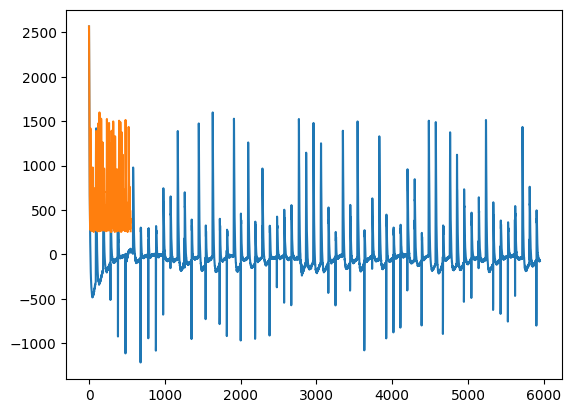

In [ ]:
print(np.std(test))
test = np.array(test[50:])
# sos = sig.butter(1, [1, 35], btype='bandpass', fs=100, output='sos')
# test = sig.sosfiltfilt(sos, test)
plt.plot(test)
plt.plot(test[test > np.mean(test) + np.std(test)])

In [ ]:
test2 = [0.38, 0.96, 0.96, 3.92, 3.99, 0.96, 0.94, 0.92, 1.85, 1.84, 2.80, 1.88, 1.88, 2.88, 0.95, 0.98, 0.96, 0.97, 0.99, 0.99, 1.89, 0.98, 0.96, 1.95, 0.92, 3.72, 0.95, 1.86, 0.92, 1.89, 0.91, 0.94, 1.94, 0.94, 0.97, 2.89, 0.96, 0.95, 0.91]
print(len(test2))

39


In [ ]:
test3 = [-102.40, -117.27, -129.20, -132.08, -132.78, -115.50, -113.60, -119.97, -116.20, -113.77, -116.22, -112.26, -102.96, -92.37, -104.23, -104.05, -99.46, -90.01, -92.28, -95.10, -79.85, -80.72, -91.55, -83.55, -69.48, -75.94, -87.36, -111.36, 33.80, 1366.72, 1086.27, 838.02, 919.17, 944.83, 812.97, 693.14, 585.32, 509.22, 443.06, 383.09, 340.54, 275.65, 210.68, 185.13, 158.48, 120.19, 88.19, 78.94, 50.92, 16.85, 2.55, 0.62, -9.71, -38.76, -55.63, -57.43, -69.24, -86.50, -89.16, -91.31, -100.18, -122.80, -122.19, -111.43, -130.07, -149.74, -152.21, -149.02, -151.28, -156.38, -143.95, -143.23, -162.78, -181.15, -167.38, -154.96, -159.54, -168.23, -169.57, -164.59, -170.21, -165.50, -159.81, -165.26, -175.68, -174.41, -160.44, -157.07, -165.36, -169.64, -157.02, -155.49, -158.15, -155.76, -151.39, -156.40, -157.61, -146.53, -143.09, -144.54, -149.44, -146.83, -139.37, -144.40, -128.17, -123.49, -129.19, -138.91, -130.63, -111.19, -107.25, -110.10, -117.61, -114.87, -116.49, -105.50, -94.50, -89.57, -104.31, -110.14, -95.62, -81.50, -90.22, -122.67, 50.03, 1500.35, 1183.77, 919.21, 1004.01, 1019.93, 858.41, 703.36, 601.44, 541.94, 463.10, 396.27, 336.14, 279.14, 222.14, 184.87, 159.94, 119.78, 75.19, 52.29, 38.42, 11.55, -19.97, -32.89, -40.56, -58.34, -78.56, -81.93, -84.26, -103.03, -118.94, -114.43, -111.07, -129.22, -142.71, -142.93, -152.09, -165.67, -170.47, -156.46, -161.42, -176.27, -181.38, -168.20, -167.29, -176.17, -179.83, -174.65, -175.67, -181.23, -174.23, -167.23, -170.85, -177.03, -177.01, -168.66, -169.68, -172.20, -164.46, -166.39, -169.13, -169.79, -158.57, -149.79, -152.23, -153.57, -150.86, -153.24, -152.30, -143.73, -140.90, -143.25, -154.44, -151.07, -141.91, -137.43, -136.34, -140.63, -137.88, -137.21, -130.98, -121.89, -118.94, -118.99, -117.48, -111.05, -104.94, -110.30, -107.04, -93.36, -95.36, -100.40, -103.89, -98.66, -98.92, -108.84, -49.80, 944.50, 762.83, 508.85, 552.20, 681.00, 597.56, 460.60, 383.53, 362.65, 311.33, 257.22, 220.64, 191.33, 153.91, 112.26, 91.58, 82.04, 60.01, 34.97, 14.51, -1.05, -23.01, -32.10, -32.03, -41.87, -65.48, -77.25, -73.27, -69.27, -86.51, -95.98, -100.55, -101.65, -106.47, -115.22, -103.67, -115.30, -133.28, -138.38, -120.64, -118.64, -134.84, -134.96, -130.44, -133.14, -139.10, -133.71, -121.79, -131.81, -139.54, -139.13, -128.41, -129.62, -137.49, -134.08, -135.54, -137.41, -132.55, -124.55, -123.37, -138.26, -142.61, -128.49, -120.53, -123.92, -126.26, -120.75, -118.66, -120.44, -116.31, -108.49, -111.15, -114.83, -115.72, -106.83, -109.99, -107.72, -96.55, -97.65, -107.78, -108.70, -94.52, -88.06, -102.43, -107.41, -82.07, -82.77, -88.26, -85.03, -83.49, -80.08, -89.88, -86.18, -89.84, 425.85, 389.55, 179.02, 135.77, 358.20, 388.39, 306.93, 251.61, 199.57, 171.83, 168.92, 153.05, 111.29, 70.11, 64.72, 51.28, 35.14, 14.55, 13.37, 0.95, -27.08, -38.40, -28.23, -28.82, -43.37, -50.67, -48.65, -48.91, -64.15, -55.69, -65.03, -71.08, -60.40, -79.06, -74.46, -74.87, -81.80, -87.26, -76.44, -79.14, -85.86, -77.62, -71.08, -85.43, -86.62, -75.53, -72.85, -81.31, -88.66, -76.78, -71.64, -77.98, -79.51, -76.09, -69.19, -91.04, -60.67, -66.23, -69.85, -79.07, -84.33, -73.46, -71.59, -74.94, -71.95, -69.71, -79.79, -86.02, -57.18, -52.49, -60.46, -73.01, -66.93, -59.40, -57.58, -59.42, -53.79, -53.19, -67.46, -64.84, -49.03, -45.97, -53.58, -64.52, -43.64, -35.57, -60.93, -51.12, -36.62, -41.46, -90.42, 131.40, 963.98, 675.75, 487.06, 659.96, 728.26, 610.49, 500.89, 440.29, 406.69, 353.07, 296.13, 252.03, 218.63, 186.29, 151.94, 125.44, 108.42, 84.59, 62.90, 51.60, 32.94, 4.92, -9.43, -7.59, -12.45, -31.83, -50.92, -57.81, -60.23, -64.61, -68.70, -77.27, -88.44, -95.69, -91.37, -88.81, -101.85, -115.62, -111.36, -104.26, -103.30, -107.62, -106.39, -105.34, -115.70, -115.17, -108.97, -112.03, -121.11, -122.54, -115.30, -114.31, -124.70, -121.13, -111.17, -114.83, -115.72, -106.07, -96.91, -105.32, -120.25, -113.99, -96.55, -99.17, -113.45, -113.87, -104.87, -116.35, -108.50, -104.33, -92.70, -110.37, -110.85, -104.90, -94.36, -91.05, -97.08, -89.43, -95.93, -97.50, -91.81, -81.33, -76.53, -86.75, -86.94, -75.61, -73.63, -89.08, -81.43, -75.04, -84.11, 10.03, 1365.53, 1130.74, 857.10, 897.23, 935.74, 807.74, 655.47, 551.19, 493.40, 434.69, 365.14, 297.52, 257.68, 223.79, 175.40, 143.24, 117.27, 97.34, 62.19, 34.74, 13.70, -3.52, -21.33, -39.28, -37.55, -55.34, -77.84, -86.30, -83.80, -89.26, -107.27, -113.89, -117.01, -122.31, -132.69, -135.96, -139.02, -153.42, -159.93, -148.60, -145.87, -155.07, -160.33, -158.56, -161.17, -169.39, -164.54, -153.51, -161.47, -172.49, -163.02, -150.87, -151.73, -155.73, -155.18, -148.22, -157.15, -161.59, -152.04, -144.42, -156.24, -162.88, -150.08, -146.23, -149.09, -151.30, -138.18, -143.35, -151.43, -143.52, -134.02, -134.76, -145.56, -134.52, -124.26, -124.06, -124.02, -120.21, -114.74, -121.76, -120.43, -114.79, -106.61, -115.25, -119.61, -109.29, -105.28, -105.83, -111.27, -99.69, -100.68, -99.41, -138.54, 127.36, 488.16, 193.72, 108.98, 341.11, 391.85, 291.08, 228.82, 218.34, 183.19, 148.15, 128.31, 100.77, 68.33, 46.84, 41.65, 29.02, 4.73, -0.37, -4.64, -17.81, -39.19, -32.22, -23.71, -38.34, -55.53, -56.64, -53.88, -60.80, -74.61, -66.56, -72.20, -87.22, -90.09, -77.88, -59.01, -84.79, -106.95, -84.23, -74.95, -82.57, -89.72, -72.49, -79.70, -98.89, -80.77, -72.60, -71.39, -89.30, -85.28, -76.72, -81.48, -78.08, -82.57, -70.76, -80.04, -85.32, -75.22, -69.74, -69.18, -75.87, -66.11, -66.78, -70.74, -70.18, -63.22, -63.81, -71.54, -61.27, -51.20, -54.84, -65.58, -62.86, -60.69, -63.96, -62.47, -57.56, -59.41, -67.44, -65.59, -56.04, -56.77, -65.29, -60.52, -51.02, -51.76, -51.94, -47.43, -41.04, -44.04, -58.42, -91.48, 68.18, 1159.59, 862.55, 661.88, 759.06, 807.56, 682.73, 596.46, 504.33, 425.19, 369.67, 330.48, 292.95, 233.82, 193.00, 174.04, 139.12, 104.13, 74.45, 65.76, 48.50, 16.26, 3.93, 0.95, -15.70, -36.41, -48.99, -51.27, -62.44, -71.21, -66.50, -74.46, -96.11, -102.85, -104.48, -117.01, -95.00, -131.41, -135.65, -124.54, -122.61, -118.36, -120.36, -132.98, -137.55, -135.61, -127.56, -135.48, -138.91, -134.43, -135.62, -142.74, -138.38, -125.20, -128.84, -133.51, -130.85, -122.62, -127.46, -140.01, -124.83, -116.62, -125.25, -132.65, -116.23, -112.26, -123.44, -122.35, -113.74, -106.35, -109.88, -125.14, -107.59, -99.56, -115.82, -106.10, -93.13, -101.37, -106.40, -104.58, -88.97, -91.27, -101.68, -90.55, -86.34, -88.36, -100.98, -87.34, -74.95, -85.61, -92.73, -130.86, 247.55, 535.38, 240.78, 160.54, 384.66, 429.67, 338.90, 273.74, 225.39, 191.72, 167.66, 143.64, 112.06, 78.64, 62.22, 49.92, 32.53, 10.89, 5.66, -1.67, -17.85, -30.10, -31.54, -31.89, -46.39, -52.92, -50.71, -57.00, -66.86, -67.72, -57.31, -66.18, -79.70, -76.89, -73.94, -82.33, -92.70, -89.13, -85.24, -92.64, -89.88, -80.11, -73.96, -83.09, -86.82, -80.13, -80.03, -81.52, -84.16, -74.18, -68.73, -89.42, -87.58, -81.07, -78.74, -86.52, -88.40, -81.27, -87.13, -99.17, -94.49, -80.46, -81.63, -83.43, -80.07, -71.67, -74.20, -75.56, -65.28, -64.31, -64.07, -72.36, -45.54, -72.44, -80.45, -64.18, -67.08, -46.54, -62.06, -63.53, -49.47, -58.98, -53.68, -52.41, -45.27, -57.20, -61.60, -44.46, -36.52, -42.95, -49.82, -50.71, -65.34, 40.36, 1291.69, 1052.22, 793.39, 842.40, 887.61, 772.61, 633.33, 537.50, 482.51, 425.23, 359.82, 300.79, 256.20, 219.64, 175.16, 135.59, 112.39, 101.47, 66.22, 37.23, 24.16, 14.18, -2.65, -21.12, -29.37, -41.23, -62.29, -75.72, -75.93, -83.57, -108.17, -115.63, -106.81, -109.23, -118.16, -124.87, -131.79, -139.54, -145.96, -139.16, -124.63, -134.01, -146.14, -149.83, -144.65, -145.67, -152.75, -143.08, -142.26, -149.65, -155.98, -142.34, -132.22, -141.91, -147.29, -150.86, -141.11, -133.44, -130.07, -125.47, -130.42, -138.45, -135.83, -126.10, -125.27, -129.62, -132.94, -124.64, -121.88, -122.73, -121.42, -116.55, -122.20, -126.60, -120.83, -108.82, -115.03, -121.07, -111.92, -111.98, -115.03, -105.15, -98.97, -102.78, -109.77, -108.43, -91.42, -83.51, -103.61, -105.42, -99.03, -89.91, -96.80, -122.74, 36.36, 1272.52, 944.43, 743.85, 854.71, 875.41, 735.53, 604.66, 532.10, 466.79, 400.96, 350.93, 294.09, 236.37, 176.16, 160.11, 140.30, 100.63, 57.67, 39.72, 32.35, 4.02, -14.20, -22.39, -36.51, -64.95, -75.61, -71.35, -80.95, -97.68, -106.27, -105.31, -109.63, -119.01, -106.87, -124.41, -143.82, -160.65, -147.26, -131.13, -140.89, -150.84, -150.20, -147.01, -147.00, -150.79, -144.12, -147.06, -156.88, -150.14, -139.41, -142.13, -160.24, -164.61, -148.98, -148.99, -150.52, -150.88, -147.18, -155.39, -155.09, -139.09, -132.95, -137.54, -150.03, -139.39, -128.47, -131.15, -134.07, -119.60, -122.18, -137.21, -126.43, -109.42, -109.10, -122.68, -118.37, -109.75, -110.70, -110.17, -104.73, -99.63, -110.53, -110.13, -103.96, -91.10, -100.13, -113.68, -88.89, -92.77, -99.77, -129.53, 202.36, 448.61, 159.14, 68.77, 313.20, 381.32, 283.98, 214.97, 186.93, 168.02, 141.46, 116.84, 82.83, 57.93, 39.78, 26.29, 21.52, 5.95, -13.73, -22.28, -24.34, -30.15, -39.90, -36.94, -44.57, -57.79, -64.78, -55.84, -50.65, -72.91, -75.25, -78.85, -68.35, -74.15, -79.35, -75.29, -91.00, -102.38, -88.44, -72.93, -77.54, -88.51, -90.40, -85.54, -94.99, -89.69, -77.03, -76.25, -89.71, -94.48, -75.91, -73.70, -80.76, -82.46, -76.04, -79.04, -88.87, -75.32, -67.49, -80.77, -93.08, -83.16, -66.35, -68.36, -78.71, -73.62, -66.32, -75.18, -78.08, -65.88, -51.56, -65.55, -74.99, -71.21, -63.46, -68.42, -71.14, -66.48, -60.81, -77.64, -73.36, -65.50, -61.33, -71.70, -74.20, -61.15, -69.38, -71.37, -64.26, -56.48, -74.32, 13.91, 1408.95, 1179.15, 901.41, 923.10, 967.02, 841.09, 687.04, 581.57, 518.18, 452.05, 377.67, 324.06, 286.09, 232.16, 181.98, 149.38, 123.30, 97.28, 70.52, 53.44, 22.76, -2.09, -13.40, -15.37, -27.23, -61.19, -79.25, -74.51, -81.71, -98.62, -109.53, -107.61, -122.32, -137.25, -134.78, -130.40, -139.20, -152.70, -154.45, -138.94, -143.54, -154.51, -161.71, -164.96, -165.75, -172.01, -167.45, -165.59, -179.56, -180.65, -176.36, -169.26, -175.13, -179.58, -170.04, -170.77, -175.50, -175.12, -164.41, -159.55, -173.54, -172.37, -167.54, -157.27, -157.06, -156.26, -159.10, -164.33, -160.29, -154.00, -143.38, -146.88, -155.32, -155.08, -145.16, -138.97, -139.75, -144.49, -137.29, -138.59, -134.35, -126.50, -126.12, -127.55, -130.17, -118.66, -115.13, -120.34, -108.70, -106.65, -112.98, -111.48, -99.74, -93.11, -110.47, -99.49, 648.05, 598.71, 346.33, 348.36, 528.62, 500.08, 386.24, 330.68, 322.58, 282.70, 225.28, 189.42, 173.17, 147.25, 115.20, 93.05, 77.84, 60.52, 35.09, 30.47, 26.32, 7.87, -14.79, -18.74, -10.59, -21.52, -35.54, -42.72, -44.45, -57.00, -62.31, -51.46, -49.59, -71.90, -84.87, -84.21, -74.95, -83.33, -92.94, -83.12, -81.51, -88.71, -85.90, -80.66, -76.37, -95.81, -91.40, -85.79, -80.64, -86.98, -90.79, -87.16, -93.11, -96.06, -89.95, -80.88, -87.80, -95.54, -86.79, -82.40, -84.37, -87.88, -87.21, -86.29, -89.86, -77.07, -69.43, -69.86, -80.59, -78.62, -71.32, -65.77, -75.81, -77.47, -71.80, -75.75, -75.94, -68.40, -58.24, -67.16, -73.11, -69.23, -66.02, -62.97, -61.48, -52.01, -59.59, -71.28, -57.41, -44.96, -48.03, -58.63, -97.60, 62.91, 1301.69, 1010.64, 770.45, 873.27, 893.55, 760.39, 633.42, 557.25, 494.86, 423.66, 361.72, 322.49, 266.74, 209.29, 184.80, 159.92, 112.19, 77.91, 72.67, 56.99, 28.17, 0.73, -11.20, -17.12, -35.23, -49.47, -57.46, -79.87, -89.83, -94.51, -99.43, -101.38, -97.30, -138.79, -150.33, -123.53, -121.61, -142.39, -148.16, -144.25, -144.82, -141.16, -144.07, -157.67, -162.47, -152.25, -149.79, -156.02, -157.52, -152.57, -155.93, -162.05, -153.67, -144.82, -152.54, -161.99, -158.96, -146.85, -153.79, -155.47, -149.80, -146.92, -148.50, -158.74, -139.97, -136.96, -154.44, -146.52, -132.47, -135.91, -148.87, -147.45, -132.70, -128.38, -140.23, -140.05, -127.88, -127.21, -130.84, -127.17, -110.35, -113.88, -122.31, -118.28, -107.45, -107.87, -117.83, -102.79, -94.60, -106.28, -107.59, -91.97, -142.82, 77.02, 867.41, 579.61, 401.65, 571.07, 621.08, 536.82, 445.93, 379.23, 340.37, 307.47, 263.88, 215.42, 184.00, 158.97, 129.41, 94.21, 73.57, 63.28, 52.45, 24.80, 8.26, -3.31, -12.94, -24.36, -33.19, -42.91, -61.94, -72.61, -76.70, -75.41, -84.96, -94.85, -94.96, -100.30, -108.42, -108.86, -111.24, -115.61, -118.18, -116.53, -109.30, -114.38, -121.68, -127.23, -123.26, -123.82, -126.23, -119.23, -119.81, -128.30, -133.38, -120.20, -107.91, -118.60, -129.52, -126.09, -118.44, -121.14, -118.00, -112.69, -113.68, -125.30, -118.25, -98.34, -99.60, -115.83, -117.48, -101.94, -95.92, -107.36, -107.09, -100.19, -104.60, -107.94, -99.64, -87.02, -96.87, -104.55, -105.65, -88.47, -88.11, -91.06, -85.71, -83.65, -95.29, -98.86, -80.00, -72.42, -81.20, -87.12, -80.20, -73.22, -76.09, -73.75, -73.94, -99.02, 12.50, 1354.75, 1093.24, 835.91, 895.90, 930.87, 797.46, 652.99, 571.07, 511.85, 451.28, 380.52, 319.44, 277.39, 230.82, 189.24, 154.92, 126.92, 98.15, 69.21, 53.12, 34.82, 6.13, -11.41, -18.69, -29.54, -54.16, -69.97, -70.75, -75.49, -92.57, -105.03, -106.52, -112.95, -125.88, -132.04, -129.73, -136.76, -148.32, -150.35, -145.53, -151.96, -156.54, -160.68, -153.34, -162.94, -172.85, -163.86, -151.07, -157.09, -172.95, -168.44, -159.00, -159.76, -166.01, -156.14, -153.76, -155.46, -155.11, -145.92, -145.22, -157.19, -157.05, -147.91, -139.63, -145.22, -149.60, -140.04, -136.22, -141.36, -142.60, -131.53, -137.20, -144.63, -132.02, -125.18, -125.80, -131.26, -119.69, -109.30, -116.66, -113.12, -108.48, -99.77, -102.98, -111.34, -101.98, -98.96, -104.30, -93.45, -88.56, -92.69, -98.99, -92.93, -85.40, -109.37, -20.34, 1021.40, 798.84, 580.50, 618.81, 714.53, 651.93, 529.86, 433.63, 395.98, 364.14, 307.90, 251.84, 220.86, 191.38, 143.30, 116.52, 108.54, 77.79, 47.61, 28.94, 28.99, 14.58, -11.65, -22.54, -24.40, -38.51, -61.64, -64.19, -64.05, -76.15, -94.24, -91.78, -86.64, -107.39, -132.89, -119.32, -118.32, -130.21, -133.09, -123.16, -127.59, -137.76, -137.94, -124.33, -123.32, -139.01, -150.38, -139.47, -133.80, -139.26, -145.13, -143.51, -144.64, -149.46, -144.56, -138.07, -142.57, -151.24, -153.33, -143.22, -140.78, -136.39, -135.34, -130.53, -138.47, -136.60, -131.59, -125.83, -128.24, -134.13, -125.69, -125.17, -131.11, -127.23, -115.68, -119.72, -130.55, -123.31, -102.59, -103.66, -109.99, -103.17, -102.28, -105.86, -105.97, -86.27, -84.55, -87.17, -97.66, -99.43, -83.93, -77.92, -82.53, -113.99, 6.61, 1214.51, 991.87, 745.44, 781.52, 844.84, 735.73, 625.95, 505.38, 450.48, 398.53, 343.51, 294.58, 250.90, 194.84, 162.34, 140.09, 109.68, 87.17, 60.49, 39.64, 15.64, 4.53, 1.09, -20.97, -39.20, -51.18, -57.11, -70.68, -84.58, -79.59, -86.73, -101.35, -111.70, -114.20, -111.02, -126.17, -136.66, -134.64, -131.88, -133.49, -134.63, -128.84, -129.72, -143.59, -146.18, -143.01, -141.48, -141.12, -145.58, -148.17, -150.32, -148.56, -140.55, -141.65, -144.95, -150.30, -146.28, -140.76, -137.91, -140.25, -138.54, -139.65, -141.43, -132.00, -125.17, -125.80, -131.26, -131.82, -119.06, -114.46, -118.66, -123.47, -123.11, -121.51, -121.12, -109.65, -111.43, -113.38, -122.19, -115.22, -101.40, -94.27, -99.37, -101.37, -95.02, -98.04, -98.77, -88.32, -74.42, -87.76, -103.87, -88.80, -70.75, -80.80, -9.65, 1232.58, 1069.05, 780.77, 786.25, 893.77, 795.33, 619.86, 509.98, 477.38, 429.30, 353.22, 292.37, 245.82, 204.24, 165.37, 134.75, 115.98, 78.83, 44.82, 26.75, 20.87, 1.25, -25.49, -34.22, -42.40, -62.58, -78.83, -78.20, -84.12, -107.54, -118.51, -115.85, -115.20, -130.22, -136.88, -137.73, -152.35, -156.64, -149.33, -141.49, -150.98, -161.61, -152.05, -143.67, -156.81, -168.33, -161.25, -154.23, -159.37, -165.92, -153.08, -153.02, -167.42, -167.10, -153.37, -150.06, -163.67, -158.61, -142.22, -139.02, -148.87, -149.73, -130.97, -139.34, -148.18, -140.46, -134.80, -141.02, -151.62, -138.26, -121.37, -128.68, -140.30, -134.00, -115.80, -126.57, -129.17, -122.21, -115.98, -122.82, -127.51, -110.43, -104.80, -114.05, -117.81, -100.51, -99.36, -112.74, -108.39, -96.72, -91.62, -104.80, -104.95, -97.40, -90.27, -96.89, -93.94, -128.88, 211.62, 499.40, 224.50, 154.33, 380.13, 424.03, 317.81, 259.55, 249.27, 224.03, 187.60, 154.53, 117.72, 90.62, 78.77, 63.02, 39.49, 26.22, 21.50, 2.92, -12.19, -17.36, -15.57, -30.31, -46.76, -43.91, -43.98, -57.65, -60.95, -57.95, -64.06, -74.63, -81.74, -66.01, -69.79, -83.60, -96.80, -93.16, -90.00, -99.86, -92.38, -78.44, -86.45, -104.31, -95.73, -80.76, -85.49, -102.57, -101.38, -91.23, -98.64, -105.74, -97.59, -91.83, -104.86, -116.34, -102.43, -90.73, -96.24, -106.68, -105.41, -96.00, -93.72, -90.90, -88.70, -94.24, -102.40, -96.03, -80.08, -84.57, -92.48, -95.15, -84.42, -79.55, -84.44, -81.07, -73.43, -74.62, -77.94, -70.40, -60.99, -58.72, -65.00, -58.93, -62.02, -65.04, -65.01, -52.87, -57.52, -65.47, -53.74, -51.66, -48.88, -61.11, -65.58, -40.11, 600.19, 489.30, 284.26, 293.92, 464.65, 448.99, 364.80, 306.54, 272.00, 240.90, 226.56, 185.93, 146.54, 137.79, 123.54, 89.75, 66.43, 49.41, 46.07, 38.43, 18.38, 4.44, 5.62, -5.47, -21.80, -19.68, -22.96, -35.88, -53.42, -45.52, -29.20, -61.66, -57.37, -56.33, -71.25, -78.65, -83.47, -74.77, -78.74, -81.97, -83.51, -77.05, -70.19, -79.15, -89.66, -84.61, -80.35, -83.88, -85.49, -79.05, -80.53, -86.20, -90.60, -84.83, -78.89, -77.46, -77.87, -83.28, -82.31, -83.59, -74.04, -69.46, -76.70, -82.24, -79.02, -69.14, -65.24, -74.92, -62.84, -72.82, -75.99, -60.07, -47.88, -58.59, -67.25, -71.61, -60.53, -39.65, -56.60, -59.18, -48.42, -49.62, -52.94, -42.37, -41.33, -50.94, -52.50, -47.57, -31.97, -43.37, -45.37, -29.92, -54.25, -41.92, -42.74, -80.11, 220.36, 628.18, 329.94, 220.00, 450.60, 492.62, 415.54, 346.86, 296.90, 266.63, 253.26, 214.38, 178.44, 144.73, 125.97, 113.86, 95.76, 74.70, 55.96, 46.13, 31.62, 22.81, 16.13, 9.96, -7.46, -20.01, -22.28, -24.34, -24.84, -37.86, -41.00, -47.07, -45.50, -50.43, -50.86, -54.00, -72.96, -76.78, -72.40, -62.99, -72.86, -79.03, -77.49, -79.39, -78.34, -75.81, -75.19, -84.15, -89.35, -87.57, -75.76, -77.46, -81.66, -84.19, -81.77, -81.94, -81.99, -77.45, -80.90, -91.60, -87.35, -71.91, -65.91, -75.08, -78.05, -78.77, -78.19, -73.49, -64.02, -58.69, -77.89, -85.56, -70.72, -60.31, -61.59, -72.52, -63.78, -63.19, -67.60, -61.83, -51.34, -50.32, -66.77, -69.22, -57.67, -43.51, -51.47, -58.70, -55.89, -54.46, -54.87, -47.38, -37.99, -49.38, -68.05, -61.19, -42.08, -36.71, -96.86, 264.10, 850.38, 533.02, 400.26, 604.11, 652.57, 517.12, 416.90, 401.05, 369.15, 309.87, 259.90, 231.15, 194.63, 162.29, 138.56, 122.96, 94.92, 64.64, 59.60, 46.25, 27.86, 10.52, 1.78, -6.40, -23.54, -31.47, -28.08, -39.40, -61.85, -68.79, -57.57, -63.96, -79.92, -91.36, -81.23, -89.40, -101.23, -97.26, -93.27, -97.62, -110.80, -107.16, -92.63, -101.25, -111.68, -105.10, -102.75, -105.97, -109.79, -102.36, -96.02, -110.42, -119.20, -109.95, -99.37, -102.88, -110.56, -107.86, -104.17, -111.63, -106.60, -90.22, -92.33, -102.70, -104.44, -95.76, -89.87, -92.25, -89.78, -88.43, -94.17, -96.32, -91.53, -81.27, -87.13, -93.10, -86.96, -78.65, -81.19, -81.05, -82.53, -82.13, -76.72, -72.38, -67.54, -64.85, -68.76, -71.98, -62.89, -56.91, -62.29, -59.79, -62.23, -64.33, -64.84, -58.13, -58.03, -83.80, 10.87, 1085.07, 864.28, 622.85, 691.23, 769.19, 652.99, 525.56, 466.73, 441.14, 378.08, 312.78, 265.16, 236.97, 205.13, 162.55, 139.38, 117.85, 83.83, 58.17, 51.97, 43.65, 15.09, -14.56, -23.24, -27.61, -33.97, -52.96, -50.71, -65.34, -84.05, -89.32, -86.04, -76.91, -102.01, -107.31, -108.59, -121.04, -114.18, -122.39, -119.06, -127.36, -136.19, -126.94, -116.37, -122.92, -146.49, -146.12, -137.68, -130.34, -133.87, -131.69, -137.24, -147.68, -144.13, -130.38, -121.75, -134.83, -137.99, -137.24, -126.44, -126.11, -122.23, -121.30, -126.38, -130.64, -121.05, -105.08, -111.85, -123.34, -125.36, -119.02, -113.69, -103.31, -100.80, -104.74, -116.32, -111.53, -92.16, -83.70, -96.06, -110.43, -103.28, -85.62, -97.29, -94.79, -72.95, -76.78, -96.67, -87.82, -59.13, -71.17, -85.45, -81.32, -102.32, 16.26, 1153.88, 881.65, 693.80, 725.81, 772.23, 691.65, 594.82, 480.42, 396.66, 374.92, 332.50, 277.51, 230.09, 195.89, 171.70, 130.97, 95.34, 88.26, 75.92, 35.02, 8.46, 2.04, -2.54, -24.89, -45.45, -42.08, -54.15, -80.59, -86.21, -79.22, -85.88, -90.52, -120.47, -133.01, -99.63, -131.77, -157.73, -135.18, -131.25, -151.54, -142.79, -132.33, -141.18, -153.18, -151.53, -140.51, -143.92, -154.60, -150.35, -144.02, -149.31, -149.83, -143.13, -144.55, -155.51, -154.36, -138.16, -130.45, -145.28, -151.14, -134.34, -131.81, -128.92, -141.12, -134.96, -128.16, -134.87, -132.69, -117.00, -121.55, -139.34, -133.01, -104.18, -119.21, -127.40, -115.72, -105.31, -111.90, -110.46, -96.46, -93.08, -105.91, -111.29, -89.07, -84.47, -97.01, -99.28, -87.69, -90.20, -100.67, -97.89, -81.28, -77.28, -89.96, 657.18, 789.79, 475.15, 391.60, 599.74, 613.59, 491.02, 379.50, 349.54, 321.06, 275.50, 219.75, 189.60, 163.35, 118.33, 94.56, 80.48, 66.46, 36.53, 11.10, 4.95, -1.08, -18.47, -30.25, -38.40, -51.75, -62.56, -67.44, -63.31, -73.70, -90.61, -90.15, -81.69, -81.17, -99.25, -105.13, -113.37, -116.12, -118.31, -113.52, -114.64, -125.53, -126.65, -122.36, -120.57, -126.21, -126.05, -122.22, -122.81, -120.68, -110.30, -105.52, -119.54, -128.99, -114.59, -103.52, -106.92, -122.91, -119.19, -118.29, -114.28, -110.27, -100.21, -106.12, -121.20, -118.01, -99.04, -92.18, -104.18, -110.11, -97.89, -94.94, -96.50, -96.88, -84.83, -91.03, -98.59, -90.56, -76.48, -89.01, -95.83, -86.10, -75.40, -79.65, -83.71, -80.14, -73.96, -75.51, -75.12, -64.41, -54.24, -66.19, -72.87, -64.63, -54.29, -56.35, -72.01, 3.09, 1086.99, 898.12, 648.47, 695.90, 778.66, 672.72, 542.46, 467.77, 425.47, 377.32, 320.95, 267.89, 220.94, 189.89, 170.25, 150.34, 110.64, 80.57, 59.66, 48.54, 31.44, 19.73, 10.83, -12.56, -34.13, -42.38, -32.99, -42.10, -63.26, -76.72, -77.69, -75.65, -81.98, -86.55, -92.96, -109.68, -120.54, -111.03, -110.25, -119.92, -126.05, -120.70, -112.58, -123.52, -130.71, -127.90, -122.67, -131.26, -131.82, -121.34, -118.05, -136.98, -146.10, -133.13, -129.24, -131.33, -133.36, -132.33, -131.32, -138.66, -133.61, -118.73, -121.97, -137.16, -137.04, -121.08, -116.47, -123.70, -124.69, -122.65, -122.16, -125.83, -115.34, -106.74, -113.76, -123.80, -119.40, -105.44, -109.66, -109.92, -109.22, -109.81, -111.47, -111.11, -100.41, -97.82, -107.82, -108.71, -96.79, -91.64, -92.67, -90.65, -88.64, -94.22, -100.12, -101.55, 354.75, 368.59, 145.89, 94.39, 320.14, 374.65, 283.13, 217.04, 213.22, 176.64, 142.78, 124.74, 105.97, 72.62, 54.70, 42.03, 29.11, 13.86, 1.83, 2.72, -13.00, -31.20, -34.08, -29.47, -42.77, -53.56, -57.69, -45.79, -64.15, -74.66, -56.71, -69.07, -56.12, -78.79, -96.39, -77.89, -81.77, -90.29, -81.73, -78.90, -82.01, -86.55, -77.79, -72.64, -89.60, -86.11, -76.92, -73.19, -84.42, -88.65, -82.09, -81.26, -73.48, -70.84, -66.41, -76.72, -79.21, -71.46, -62.01, -66.55, -74.48, -71.84, -67.41, -71.65, -65.09, -54.40, -69.27, -73.62, -63.29, -49.42, -56.69, -51.61, -55.70, -56.69, -58.44, -49.00, -49.00, -42.17, -57.97, -56.48, -42.46, -40.59, -44.69, -47.96, -38.13, -42.58, -56.55, -47.03, -34.11, -44.65, -88.15, 59.12, 1365.25, 1057.85, 805.37, 884.74, 938.79, 799.38, 673.93, 567.79, 489.82, 445.20, 361.61, 314.88, 292.97, 224.72, 167.28, 154.93, 142.85, 100.48, 62.95, 49.33, 29.36, 1.02, -17.20, -13.26, -25.96, -55.57, -78.65, -71.33, -86.25, -98.96, -92.16, -107.97, -115.58, -134.10, -136.30, -138.35, -141.12, -150.13, -150.03, -143.94, -152.33, -156.63, -150.84, -151.72, -165.59, -167.42, -154.21, -151.77, -167.12, -170.06, -160.15, -157.76, -164.77, -158.88, -158.21, -161.09, -163.30, -151.69, -141.31, -154.73, -164.80, -150.54, -133.44, -139.18, -137.53, -133.33, -129.29, -141.21, -135.74, -118.49, -116.60, -135.87, -139.76, -124.77, -115.84, -122.03, -118.21, -111.22, -120.92, -131.60, -118.25, -91.51, -95.67, -117.92, -121.01, -104.32, -92.70, -96.72, -96.93, -92.43, -95.90, -105.08, -91.36, -72.88, -86.63, -92.98, -90.72, -78.04, -83.32, -82.32, -75.25, -99.33, -20.19, 909.93, 699.11, 498.01, 534.41, 633.47, 589.88, 491.36, 390.96, 360.65, 339.68, 283.79, 239.19, 210.22, 188.06, 151.60, 120.80, 95.92, 84.60, 64.42, 46.66, 30.23, 11.09, -1.11, -11.65, -9.64, -21.29, -38.52, -52.54, -40.75, -56.87, -74.42, -70.31, -65.52, -92.43, -95.14, -85.17, -112.35, -114.36, -112.57, -109.86, -111.48, -113.39, -122.20, -120.53, -117.85, -126.31, -129.11, -122.96, -114.65, -124.02, -127.80, -124.16, -117.21, -123.88, -126.25, -125.30, -122.80, -129.78, -123.12, -110.13, -115.34, -129.49, -123.05, -113.91, -109.43, -118.21, -118.05, -108.15, -113.35, -115.36, -100.67, -99.40, -106.68, -106.16, -103.76, -88.01, -90.28, -99.93, -92.40, -89.82, -93.75, -87.87, -78.87, -76.69, -92.10, -83.68, -70.27, -71.58, -77.97, -79.51, -68.50, -68.12, 621.49, 602.91, 356.45, 319.70, 528.53, 501.58, 408.60, 324.70, 283.97, 269.58, 237.28, 197.62, 159.98, 145.58, 117.83, 92.93, 74.02, 67.94, 55.09, 32.27, 22.20, 15.98, 3.86, -15.00, -21.07, -22.53, -34.27, -49.24, -54.37, -45.74, -57.32, -66.94, -64.71, -61.90, -74.11, -89.20, -81.46, -81.11, -89.37, -98.19, -77.57, -69.55, -86.58, -98.28, -93.52, -84.02, -96.14, -99.07, -88.40, -94.92, -108.64, -105.88, -87.01, -86.24, -104.26, -106.34, -97.74, -88.83, -97.30, -95.56, -87.55, -90.17, -96.87, -90.14, -77.14, -81.58, -98.59, -91.31, -78.18, -81.08, -82.54, -79.10, -73.71, -83.03, -79.97, -70.89, -70.97, -78.58, -75.11, -68.20, -59.70, -69.03, -64.46, -58.80, -57.43, -60.90, -54.15, -48.73, -57.28, -66.93, -54.85, -50.41, -75.89, 29.46, 1372.50, 1122.56, 846.02, 903.66, 950.95, 819.76, 654.58, 562.36, 518.09, 459.61, 387.84, 327.28, 285.35, 229.71, 190.49, 168.12, 145.27, 101.07, 57.02, 42.59, 31.52, 9.89, -18.85, -22.00, -35.65, -54.12, -70.72, -70.93, -70.98, -95.27, -107.96, -106.47, -100.80, -118.40, -130.23, -128.54, -137.23, -146.16, -151.35, -142.74, -146.73, -161.35, -158.05, -148.91, -152.01, -158.83, -161.99, -160.48, -162.39, -160.58, -156.35, -156.08, -162.09, -167.33, -158.74, -154.38, -154.85, -155.72, -157.45, -160.14, -163.07, -153.16, -143.18, -144.56, -152.48, -149.84, -143.89, -142.46, -145.90, -136.12, -136.79, -147.57, -143.34, -127.15, -115.66, -123.50, -132.22, -118.40, -115.82, -122.03, -116.70, -104.03, -106.28, -125.79, -113.81, -92.72, -93.69, -109.10, -104.47, -88.94, -93.54, -97.68, -95.65, -120.19, 18.77, 1274.34, 959.28, 751.99, 834.68, 855.40, 718.56, 600.56, 525.04, 464.33, 409.46, 346.91, 287.81, 240.92, 212.92, 178.09, 119.61, 88.05, 81.18, 64.36, 32.23, 7.78, -4.95, -25.47, -47.11, -54.61, -58.70, -81.68, -100.89, -105.52, -104.37, -106.36, -125.81, -133.54, -131.61, -147.08, -162.19, -150.67, -149.40, -168.06, -159.67, -153.85, -156.24, -166.68, -163.13, -163.03, -172.11, -171.27, -168.79, -159.09, -168.88, -175.80, -167.61, -164.87, -164.21, -166.33, -160.01, -163.80, -167.74, -160.35, -149.47, -146.08, -156.64, -159.95, -142.54, -139.85, -148.31, -149.59, -140.80, -153.85, -160.79, -141.23, -129.68, -128.40, -144.03, -137.94, -117.50, -116.36, -125.95, -115.37, -112.81, -125.09, -122.75, -103.98, -91.86, -101.83, -105.75, -102.91, -90.84, -72.76, -92.66, -106.57, 11.44, 1315.05, 1054.83, 828.91, 864.63, 883.87, 762.60, 650.64, 545.47, 473.81, 417.82, 359.55, 306.03, 258.22, 221.64, 191.57, 144.87, 107.80, 85.95, 68.54, 40.82, 17.44, 1.18, -17.16, -36.76, -49.08, -45.23, -61.74, -80.14, -84.59, -90.97, -99.34, -115.77, -107.60, -123.83, -136.85, -142.27, -150.41, -147.06, -146.26, -153.65, -151.64, -147.36, -148.60, -155.73, -151.38, -151.85, -167.14, -164.00, -145.79, -146.71, -164.38, -165.61, -157.56, -154.10, -160.09, -153.95, -148.68, -161.06, -166.32, -153.18, -138.63, -148.01, -156.35, -150.77, -141.08, -148.61, -146.63, -135.53, -132.09, -145.68, -147.44, -131.18, -131.80, -141.05, -137.22, -133.26, -128.51, -131.92, -123.64, -123.91, -130.81, -133.99, -123.38, -106.40, -112.17, -117.35, -117.84, -108.86, -112.76, -109.15, -33.18, 1157.88, 1059.36, 757.94, 748.88, 858.96, 770.24, 619.87, 509.98, 446.28, 394.49, 340.26, 285.45, 225.94, 173.65, 151.16, 128.28, 95.45, 57.94, 38.26, 14.55, -8.62, -25.60, -31.97, -51.72, -83.79, -96.09, -94.50, -98.67, -123.95, -131.57, -131.90, -140.32, -147.66, -152.47, -143.77, -157.60, -175.35, -170.53, -154.20, -155.57, -177.89, -175.70, -169.86, -172.24, -181.92, -175.15, -168.97, -181.13, -188.62, -176.77, -161.77, -170.29, -181.45, -174.28, -166.48, -169.91, -168.46, -159.01, -157.49, -166.98, -167.75, -157.32, -152.53, -158.20, -158.05, -151.94, -154.26, -159.37, -156.81, -140.27, -137.79, -144.78, -143.43, -134.00, -130.21, -136.12, -129.20, -126.77, -133.77, -133.19, -119.39, -116.82, -127.58, -126.38, -107.13, -101.72, -112.55, -109.86, -104.66, -102.64, -105.19, -91.39, -80.47, -145.35, 113.58, 874.72, 567.72, 405.60, 584.16, 636.38, 523.83, 423.83, 392.10, 376.09, 322.92, 263.06, 217.50, 197.40, 177.37, 140.68, 110.58, 92.69, 67.89, 44.46, 38.80, 29.09, 11.58, -20.72, -26.24, -30.61, -33.18, -53.52, -57.68, -60.96, -75.40, -87.23, -87.06, -77.15, -86.90, -98.35, -102.64, -111.26, -115.61, -115.15, -113.52, -114.64, -127.81, -127.95, -119.64, -119.91, -126.81, -126.95, -124.71, -122.66, -127.47, -121.04, -124.04, -125.53, -131.20, -121.94, -118.19, -125.63, -126.67, -123.89, -117.15, -120.83, -116.41, -110.79, -117.02, -120.04, -110.15, -101.69, -101.93, -122.46, -117.56, -105.00, -102.72, -105.21, -100.50, -92.54, -107.30, -109.35, -93.91, -80.33, -89.94, -96.05, -89.19, -82.22, -83.57, -82.38, -76.78, -66.33, -83.53, -86.92, -65.74, -60.63, -70.01, -95.79, 30.73, 1277.23, 967.57, 754.74, 830.03, 859.59, 730.95, 616.45, 542.53, 482.96, 417.00, 363.14, 317.52, 276.16, 229.01, 191.83, 160.10, 122.10, 93.20, 74.84, 59.03, 28.67, -4.46, -4.11, -12.37, -29.54, -50.37, -56.92, -66.08, -80.43, -89.21, -85.26, -88.85, -114.00, -125.38, -130.40, -123.27, -138.24, -141.85, -142.72, -144.45, -146.38, -133.96, -128.68, -143.34, -153.70, -150.89, -150.22, -151.57, -157.96, -149.65, -151.43, -160.21, -160.81, -149.58, -144.59, -154.00, -155.52, -143.75, -143.18, -146.84, -145.44, -139.04, -139.77, -152.84, -139.31, -122.39, -131.20, -142.43, -143.62, -122.67, -122.16, -133.42, -130.83, -127.17, -124.01, -128.55, -117.51, -119.40, -130.47, -126.32, -117.73, -105.04, -109.56, -109.14, -98.41, -95.07, -101.84, -92.10, -85.20, -88.84, -98.06, -111.67, 389.48, 402.77, 179.17, 117.60, 353.05, 390.94, 313.61, 228.95, 203.20, 200.01, 175.73, 133.46, 113.39, 92.61, 72.43, 59.97, 46.34, 23.33, 11.70, 6.62, -8.26, -23.99, -33.86, -33.21, -43.67, -57.57, -57.90, -56.46, -62.18, -71.90, -62.87, -56.14, -62.86, -77.38, -75.57, -72.86, -83.59, -90.73, -80.31, -81.59, -93.28, -87.00, -79.41, -81.38, -98.54, -98.13, -79.07, -78.26, -83.37, -92.19, -86.74, -86.94, -90.02, -84.69, -75.82, -82.78, -96.60, -90.08, -82.43, -76.04, -81.32, -77.28, -79.34, -81.36, -81.85, -65.27, -62.03, -73.39, -78.40, -72.79, -63.85, -67.00, -63.97, -62.47, -65.91, -71.29, -68.79, -59.09, -56.75, -59.97, -59.23, -55.26, -54.31, -55.59, -51.35, -47.29, -54.66, -61.74, -52.08, -45.95, -46.75, -88.66, 418.55, 624.46, 329.04, 246.33, 469.85, 514.72, 407.98, 333.66, 312.68, 280.30, 232.29, 197.93, 172.95, 147.20, 118.98, 97.00, 80.31, 57.32, 41.15, 28.90, 22.15, -4.51, -18.54, -16.61, -13.11, -24.41, -38.51, -29.78, -36.77, -50.60, -56.97, -49.41, -55.17, -74.76, -86.32, -79.25, -76.03, -88.90, -91.25, -75.89, -82.80, -91.30, -81.21, -74.22, -83.92, -104.46, -101.08, -86.61, -88.42, -102.51, -99.09, -91.44, -92.62, -99.74, -87.80, -86.43, -96.72, -99.21, -95.26, -82.93, -82.22, -83.57, -79.35, -85.91, -85.22, -81.26, -69.68, -72.20, -78.88, -78.97, -74.44, -70.31, -73.87, -68.66, -65.88, -75.83, -78.24, -75.02, -59.08, -64.33, -76.22, -74.54, -68.06, -61.19, -60.29, -57.04, -61.56, -64.17, -61.01, -42.04, -41.25, -60.02, -66.83, -54.82, -42.82, -83.16, 77.01, 1278.54, 945.13, 732.64, 855.80, 881.74, 727.95, 592.21, 540.47, 494.60, 429.67, 366.96, 315.41, 268.07, 219.47, 189.53, 164.10, 145.06, 103.29, 66.66, 50.99, 37.34, 22.67, -0.59, -11.52, -22.50, -38.81, -52.61, -52.15, -59.62, -78.11, -96.23, -90.75, -90.94, -106.91, -112.29, -117.38, -124.68, -138.58, -134.35, -122.71, -126.72, -139.07, -140.53, -135.58, -135.90, -145.84, -145.20, -145.05, -145.77, -143.67, -137.85, -137.96, -150.89, -147.18, -140.22, -131.71, -138.76, -145.77, -141.39, -139.58, -138.38, -131.27, -131.06, -132.53, -133.65, -126.33, -113.18, -115.32, -120.39, -114.03, -110.21, -122.19, -126.60, -110.97, -100.37, -106.16, -118.18, -111.97, -101.37, -107.92, -102.67, -93.06, -91.50, -105.53, -106.65, -85.68, -85.92, -94.33, -99.39, -82.41, -124.58, 45.78, 519.28, 266.47, 126.54, 305.15, 405.16, 340.56, 275.66, 225.85, 192.59, 177.73, 147.59, 106.18, 100.73, 78.18, 46.94, 33.33, 30.05, 28.49, 6.88, -8.96, -15.82, -15.96, -25.09, -37.92, -38.74, -48.80, -62.61, -67.46, -54.21, -57.84, -73.13, -81.38, -79.57, -68.52, -87.09, -93.85, -84.86, -87.24, -93.13, -77.86, -76.45, -89.00, -95.83, -95.20, -95.05, -95.01, -96.52, -87.02, -93.83, -100.79, -99.43, -83.17, -76.97, -91.41, -92.62, -86.84, -82.41, -85.13, -77.45, -78.62, -86.49, -92.19, -79.91, -65.57, -69.69, -81.30, -82.59, -71.52, -74.16, -67.21, -60.98, -69.34, -83.49, -77.81, -56.71, -56.17, -67.42, -73.17, -63.18, -50.91, -61.60, -60.39, -55.54, -56.65, -60.71, -54.10, -48.71, -39.07, -68.60, -66.63, -33.53, 675.35, 602.26, 375.26, 353.06, 521.41, 533.24, 423.83, 335.21, 314.57, 272.42, 230.38, 202.78, 174.88, 133.25, 112.58, 87.87, 65.21, 46.09, 50.57, 38.00, 12.21, 1.43, -8.76, -9.70, -19.03, -24.32, -33.94, -45.36, -56.47, -56.11, -43.89, -54.59, -69.31, -73.63, -68.60, -76.49, -85.98, -79.17, -77.52, -84.71, -80.38, -74.02, -70.97, -86.92, -96.08, -83.88, -84.73, -89.49, -90.63, -81.81, -86.51, -100.53, -92.54, -76.20, -75.29, -89.48, -90.63, -75.74, -77.45, -77.87, -81.00, -75.69, -80.48, -88.46, -77.49, -68.02, -77.11, -88.40, -77.48, -67.25, -76.92, -77.74, -73.39, -65.51, -71.19, -74.08, -58.85, -53.65, -69.09, -75.85, -62.31, -56.76, -63.77, -64.70, -54.31, -57.87, -67.07, -57.16, -42.63, -51.25, -63.20, -62.29, -51.45, 17.92, 1146.70, 1026.32, 744.66, 731.26, 841.81, 757.76, 615.33, 505.85, 453.62, 411.43, 351.18, 291.12, 244.00, 207.59, 170.73, 130.73, 102.11, 86.86, 57.38, 34.34, 14.36, 2.71, -19.83, -37.40, -43.92, -50.05, -65.94, -78.88, -70.63, -76.98, -95.96, -108.13, -101.20, -105.60, -111.21, -117.12, -117.03, -125.35, -138.74, -132.87, -119.31, -117.56, -138.37, -144.92, -139.67, -139.16, -147.38, -138.75, -132.87, -143.59, -151.49, -138.98, -123.07, -128.33, -144.77, -142.67, -139.13, -140.55, -140.13, -124.10, -121.75, -140.14, -148.38, -121.54, -112.79, -122.81, -138.88, -132.14, -115.35, -119.64, -121.43, -114.28, -112.55, -123.51, -117.05, -107.15, -101.73, -117.11, -113.99, -102.62, -104.43, -99.55, -94.58, -91.86, -96.52, -104.47, -95.77, -86.08, -89.81, -95.26, -83.69, -85.44, -89.66, -80.81, -67.30, -76.18, -107.14, -12.22, 1125.77, 890.04, 651.07, 713.98, 783.78, 656.51, 521.86, 468.87, 434.83, 356.83, 294.76, 257.01, 223.63, 172.33, 134.91, 111.46, 84.56, 47.73, 35.80, 33.68, 10.41, -27.83, -37.06, -33.98, -38.55, -65.44, -73.45, -76.90, -86.84, -94.55, -91.10, -87.23, -112.09, -131.74, -121.32, -117.28, -130.72, -143.07, -139.98, -135.44, -141.93, -143.50, -129.47, -130.63, -145.32, -151.90, -138.32, -134.29, -140.90, -143.25, -140.78, -142.47, -143.63, -137.84, -132.65, -142.02, -148.07, -146.50, -134.74, -131.90, -135.77, -128.36, -131.12, -134.82, -129.65, -122.33, -119.05, -128.11, -129.54, -117.75, -115.66, -115.16, -121.11, -116.47, -120.67, -117.13, -109.45, -103.04, -103.01, -109.83, -106.92, -97.88, -83.56, -92.24, -109.50, -107.60, -97.28, -91.00, -84.17, -89.35, -92.12, -91.27, -78.17, -83.35, -124.05, 45.14, 899.16, 613.07, 443.10, 593.98, 650.89, 566.77, 444.82, 373.65, 360.26, 316.83, 255.52, 214.92, 180.09, 148.16, 116.18, 95.56, 86.79, 59.64, 26.54, 17.03, 16.25, -1.39, -21.57, -34.79, -32.67, -48.85, -61.86, -62.72, -60.66, -74.57, -93.86, -74.24, -86.20, -91.36, -96.40, -118.85, -110.62, -114.70, -114.93, -102.09, -102.78, -118.12, -118.79, -108.33, -106.56, -116.00, -119.79, -116.92, -118.50, -118.12, -112.72, -106.86, -116.83, -126.82, -118.61, -109.80, -114.50, -123.98, -124.75, -117.36, -114.81, -108.89, -102.90, -108.29, -116.41, -112.31, -95.39, -94.33, -103.94, -107.78, -98.09, -98.78, -96.67, -86.30, -88.35, -91.88, -100.31, -87.18, -71.87, -80.31, -84.63, -87.19, -84.01, -84.00, -83.24, -73.96, -61.85, -80.17, -70.94, -70.23, -78.40, -71.27, -68.03, -103.66, 175.23, 477.72, 209.41, 130.97, 371.45, 409.79, 329.54, 270.72, 240.59, 206.77, 185.70, 149.52, 115.75, 82.56, 70.76, 56.53, 34.13, 9.00, 5.21, 3.53, -12.80, -22.81, -25.23, -25.06, -42.46, -47.42, -41.79, -45.74, -58.83, -68.06, -56.64, -59.95, -63.02, -69.83, -66.17, -78.94, -88.85, -81.38, -74.26, -83.92, -94.60, -89.59, -79.28, -81.34, -87.91, -90.25, -93.85, -99.27, -89.21, -75.40, -76.61, -92.84, -89.93, -83.16, -80.76, -82.46, -76.04, -69.94, -83.64, -93.77, -76.50, -61.71, -71.79, -85.60, -86.66, -74.02, -76.28, -74.55, -63.51, -66.16, -74.38, -77.13, -60.34, -51.74, -66.35, -72.91, -66.91, -61.67, -67.23, -63.26, -52.44, -60.45, -66.94, -59.40, -47.72, -45.66, -56.54, -53.85, -47.90, -44.18, -42.53, -40.61, -38.63, -43.46, -47.66, -47.92, 55.18, 1255.82, 1048.87, 781.96, 815.37, 893.98, 781.73, 634.02, 533.12, 476.14, 426.73, 373.08, 319.92, 266.88, 218.42, 178.66, 152.37, 131.61, 109.15, 85.52, 47.20, 24.29, 13.45, 16.90, 1.81, -20.04, -38.97, -53.41, -53.86, -61.55, -58.86, -77.17, -96.76, -106.05, -99.94, -90.88, -111.45, -122.49, -128.94, -128.99, -124.45, -118.04, -115.73, -121.25, -133.20, -134.56, -125.03, -122.73, -129.00, -135.07, -130.47, -132.39, -132.09, -133.54, -131.61, -137.22, -143.88, -133.35, -124.74, -129.49, -135.94, -130.68, -120.30, -121.59, -121.14, -120.28, -112.48, -111.36, -117.91, -111.15, -107.24, -118.44, -123.42, -118.55, -110.55, -116.20, -116.05, -112.22, -111.29, -111.07, -106.47, -99.29, -91.48, -102.49, -103.64, -103.15, -96.21, -96.81, -100.75, -100.94, -109.33, -106.80, -97.09, -86.40, -93.68, -104.54, -100.34, -93.25, -129.47, 49.14, 1167.13, 821.89, 630.06, 772.62, 807.04, 664.40, 540.45, 481.70, 431.11, 374.89, 314.29, 268.56, 229.45, 187.39, 140.82, 124.27, 108.89, 80.15, 45.14, 17.73, 12.62, -3.78, -16.84, -25.31, -39.49, -64.15, -76.17, -63.15, -66.07, -81.19, -100.77, -97.15, -105.38, -109.64, -112.95, -116.02, -118.28, -147.65, -146.40, -127.13, -127.03, -136.87, -150.62, -140.29, -140.83, -145.51, -139.05, -131.43, -142.48, -154.25, -140.41, -122.65, -131.26, -145.48, -141.32, -127.42, -130.14, -130.03, -117.87, -124.80, -133.29, -136.11, -113.27, -108.51, -126.33, -130.63, -127.88, -122.66, -119.88, -111.63, -108.12, -119.41, -124.41, -111.96, -93.79, -96.98, -106.86, -107.72, -101.11, -94.20, -89.50, -86.84, -85.45, -98.00, -99.52, -77.89, -76.46, -95.07, -98.05, -78.29, -74.28, -85.45, -72.21, -69.78, -101.05, 10.50, 1282.20, 1038.56, 792.36, 814.84, 865.79, 758.99, 631.56, 509.77, 450.78, 403.16, 331.73, 270.49, 245.85, 211.83, 149.00, 106.52, 93.23, 69.54, 41.82, 21.48, 11.25, -12.45, -44.73, -52.52, -41.51, -50.98, -76.79, -89.09, -95.85, -101.27, -110.17, -105.49, -104.36, -130.64, -158.22, -152.74, -140.80, -147.78, -156.29, -156.07, -148.43, -156.45, -156.87, -147.11, -147.03, -162.94, -168.29, -151.38, -148.82, -158.06, -156.50, -156.12, -160.58, -164.69, -160.37, -156.30, -160.62, -171.53, -163.54, -159.34, -151.50, -157.95, -151.16, -148.76, -150.46, -137.97, -133.44, -130.07, -146.71, -143.14, -124.07, -127.81, -127.95, -123.44, -123.11, -127.58, -127.14, -108.83, -101.37, -117.78, -119.46, -112.28, -105.24, -108.09, -104.23, -93.44, -93.11, -99.09, -97.51, -83.47, -76.29, -91.24, -141.12, 138.12, 1147.65, 819.47, 635.54, 785.32, 803.28, 672.60, 573.53, 498.03, 430.50, 365.64, 315.09, 267.23, 219.27, 180.38, 151.27, 121.48, 90.02, 63.45, 47.94, 37.37, 9.78, -11.29, -24.72, -37.83, -53.89, -62.32, -73.45, -83.73, -96.07, -104.36, -99.54, -110.51, -119.98, -122.27, -129.65, -131.43, -140.21, -137.02, -140.04, -146.08, -142.98, -136.93, -137.74, -153.87, -153.97, -143.37, -146.12, -146.03, -146.77, -141.63, -145.70, -155.79, -145.33, -136.74, -139.97, -155.16, -151.25, -138.92, -140.50, -145.43, -139.04, -135.22, -138.84, -142.00, -127.59, -118.80, -127.30, -134.66, -128.09, -114.37, -114.09, -122.37, -120.57, -117.10, -121.58, -115.07, -101.36, -104.88, -121.66, -120.40, -105.68, -98.34, -104.91, -106.50, -101.57, -101.90, -105.77, -97.60, -81.97, -86.54, -98.27, -96.55, -73.38, -75.37, -76.61, -90.56, 521.25, 552.16, 293.37, 261.99, 473.63, 461.02, 343.43, 283.18, 270.91, 234.57, 190.90, 154.57, 129.10, 91.86, 78.31, 68.97, 49.27, 25.55, 6.93, 9.26, 2.24, -11.60, -24.04, -30.08, -47.47, -57.73, -46.56, -45.38, -66.33, -84.28, -78.00, -67.38, -76.19, -85.15, -78.97, -84.30, -104.55, -103.38, -79.58, -78.38, -92.50, -100.47, -91.01, -96.31, -105.18, -94.42, -90.31, -99.18, -114.21, -100.40, -81.89, -95.63, -107.29, -102.52, -89.99, -90.76, -97.77, -91.12, -86.48, -97.49, -100.15, -85.62, -80.60, -95.32, -100.39, -88.72, -82.86, -89.04, -89.77, -77.05, -77.77, -84.01, -80.97, -69.61, -70.67, -85.33, -90.39, -81.75, -75.11, -71.99, -73.52, -75.40, -83.44, -86.14, -73.90, -60.32, -69.18, -72.08, -61.40, -57.30, -67.69, -52.75, -46.11, -104.44, 98.43, 923.40, 634.09, 458.04, 608.20, 665.70, 555.94, 474.06, 402.71, 365.76, 334.08, 278.65, 225.82, 200.92, 180.50, 138.40, 119.13, 100.83, 72.13, 48.52, 36.75, 36.18, 11.77, -12.33, -21.94, -21.99, -35.65, -45.02, -50.31, -62.21, -71.91, -60.60, -71.52, -78.71, -81.21, -93.95, -108.40, -97.48, -103.18, -106.08, -96.92, -100.01, -112.90, -116.01, -99.31, -107.42, -123.79, -132.29, -122.21, -119.02, -128.11, -121.96, -119.71, -122.97, -125.27, -112.93, -104.64, -113.26, -116.85, -111.66, -111.16, -108.00, -113.31, -106.25, -100.75, -112.32, -104.49, -94.26, -103.16, -108.35, -104.29, -101.04, -93.42, -96.89, -93.94, -89.43, -92.90, -98.29, -82.14, -69.90, -88.18, -94.87, -78.28, -66.69, -75.27, -70.51, -71.64, -83.29, -77.76, -76.43, -83.69, 25.31, 1323.71, 1091.81, 831.01, 874.24, 921.09, 790.55, 661.18, 556.36, 459.75, 425.81, 383.47, 317.12, 244.97, 203.27, 178.79, 147.09, 104.54, 87.44, 71.94, 26.47, 11.70, 5.10, -13.94, -34.47, -50.80, -53.99, -71.44, -83.24, -95.20, -87.46, -103.80, -122.92, -123.74, -123.94, -127.78, -147.67, -155.51, -155.12, -151.24, -152.57, -146.83, -153.79, -166.84, -170.75, -159.56, -156.86, -166.07, -166.78, -162.39, -162.10, -167.33, -160.25, -151.72, -159.52, -167.47, -157.25, -142.65, -143.67, -157.58, -155.62, -147.56, -147.89, -150.25, -140.96, -143.27, -154.44, -154.11, -136.58, -132.35, -140.43, -143.14, -136.21, -136.81, -136.20, -127.70, -122.62, -125.94, -132.81, -120.82, -108.82, -107.44, -116.21, -112.26, -104.48, -104.12, -106.30, -101.52, -98.09, -109.40, -106.82, -100.13, -83.34, -137.70, 261.83, 692.81, 388.02, 271.95, 484.38, 547.81, 433.41, 338.28, 311.52, 289.13, 241.24, 200.10, 164.37, 126.92, 98.16, 79.07, 71.43, 53.66, 27.37, 5.85, 2.17, -4.03, -13.11, -21.37, -35.50, -52.57, -62.00, -57.45, -51.04, -66.94, -88.22, -94.12, -82.65, -85.19, -98.70, -96.65, -96.92, -112.15, -113.55, -94.93, -83.60, -96.80, -109.09, -101.44, -94.28, -100.14, -103.83, -100.17, -99.28, -121.07, -114.95, -102.85, -98.41, -113.27, -117.62, -102.74, -99.90, -103.01, -102.24, -96.75, -98.46, -104.94, -94.37, -77.40, -86.20, -102.74, -96.87, -79.52, -79.88, -89.83, -86.17, -86.80, -90.74, -90.94, -76.57, -73.86, -92.93, -91.47, -74.42, -61.21, -70.91, -70.98, -65.68, -71.23, -74.09, -67.19, -54.91, -62.56, -72.76, -72.18, -56.87, -66.07, -69.05, -53.84, -105.54, 129.26, 751.83, 453.85, 322.74, 511.06, 553.49, 453.75, 368.98, 338.65, 306.30, 265.11, 222.55, 177.38, 152.06, 142.15, 113.97, 82.13, 69.14, 68.27, 44.55, 22.14, 18.24, 16.54, -5.11, -27.02, -22.45, -22.11, -36.44, -54.31, -47.25, -44.03, -60.69, -70.03, -61.66, -64.95, -76.37, -77.61, -74.11, -75.54, -91.82, -91.20, -80.43, -80.10, -91.40, -88.82, -90.47, -93.91, -100.05, -92.43, -81.48, -90.98, -102.37, -99.81, -87.82, -88.71, -95.00, -91.97, -90.47, -92.39, -92.85, -80.83, -82.48, -88.18, -94.11, -87.96, -85.71, -92.00, -82.90, -82.22, -82.81, -90.54, -82.54, -72.27, -73.58, -84.52, -80.33, -71.74, -75.73, -74.42, -73.34, -68.53, -77.23, -75.54, -66.79, -65.43, -72.69, -78.99, -62.31, -59.04, -68.11, -62.72, -61.41, -69.44, -64.56, -64.13, -98.17, 74.15, 779.48, 507.56, 350.87, 540.61, 575.80, 488.72, 429.77, 354.85, 314.00, 287.45, 262.84, 211.38, 155.72, 136.97, 120.30, 101.11, 73.72, 55.73, 43.04, 21.77, 5.26, 3.54, 1.61, -20.85, -37.65, -36.40, -32.30, -37.38, -54.54, -58.68, -62.72, -66.72, -76.04, -70.70, -88.37, -86.57, -107.38, -107.85, -92.79, -99.78, -98.43, -93.55, -97.68, -113.09, -106.20, -99.98, -103.03, -112.11, -108.23, -101.99, -102.76, -108.25, -105.03, -103.49, -112.22, -118.88, -110.63, -105.60, -111.97, -108.20, -99.70, -99.17, -99.04, -97.49, -91.05, -90.25, -93.10, -96.82, -80.27, -87.65, -98.54, -87.51, -81.81, -84.23, -88.61, -81.32, -77.28, -83.90, -83.22, -68.64, -65.88, -72.80, -82.81, -75.37, -61.44, -65.66, -68.19, -59.70, -65.24, -75.68, -69.85, -52.52, -53.64, -68.33, -15.74, 1036.17, 923.02, 643.10, 659.71, 808.61, 714.84, 565.53, 464.24, 423.10, 384.34, 326.43, 263.90, 232.88, 197.32, 158.39, 131.55, 107.62, 78.32, 50.77, 38.81, 32.89, 10.97, -15.56, -25.00, -25.76, -39.60, -52.04, -61.11, -64.06, -79.94, -85.30, -85.83, -84.44, -106.86, -113.04, -116.04, -114.49, -120.95, -118.71, -121.21, -121.81, -127.26, -122.51, -117.57, -124.72, -135.55, -133.62, -127.84, -127.20, -122.50, -120.60, -124.70, -137.06, -137.77, -118.98, -114.44, -120.18, -134.45, -128.04, -124.22, -130.12, -121.69, -115.86, -116.72, -133.62, -129.36, -113.92, -117.77, -127.05, -128.53, -113.72, -115.45, -111.32, -106.52, -100.82, -110.06, -116.84, -100.27, -90.96, -96.30, -105.18, -96.70, -90.10, -98.37, -95.81, -79.27, -82.10, -94.92, -94.98, -79.82, -71.61, -82.53, -81.37, -87.16, -82.49, -78.32, -72.01, -112.96, 135.05, 1181.81, 861.85, 672.33, 813.17, 828.97, 688.66, 571.34, 513.43, 449.39, 392.96, 333.82, 277.07, 226.19, 191.91, 163.91, 139.71, 101.24, 74.51, 55.16, 39.11, 25.37, 9.16, -16.75, -36.66, -42.23, -41.30, -50.93, -76.77, -87.57, -91.69, -94.96, -104.09, -103.26, -103.82, -116.85, -133.65, -136.95, -120.30, -124.62, -136.29, -140.62, -132.56, -134.41, -138.65, -134.36, -134.85, -144.82, -147.99, -138.14, -135.00, -144.86, -148.76, -144.39, -134.23, -137.09, -130.95, -127.95, -133.30, -149.00, -142.17, -125.35, -127.36, -143.78, -146.98, -135.62, -127.56, -128.65, -118.30, -117.31, -126.18, -132.11, -118.37, -99.13, -103.58, -115.28, -116.58, -107.04, -105.49, -104.36, -98.78, -101.22, -110.91, -114.77, -99.77, -90.84, -100.06, -107.60, -102.59, -90.77, -87.91, -90.25, -80.20, -80.05, -87.60, -84.87, -73.59, -72.38, -104.71, 8.09, 1222.46, 974.07, 724.45, 785.55, 835.96, 707.79, 575.96, 510.00, 459.94, 390.20, 321.78, 277.95, 239.30, 198.11, 157.07, 132.74, 102.60, 69.53, 49.40, 39.24, 18.58, -12.96, -28.16, -39.42, -55.03, -67.90, -80.87, -85.52, -98.78, -109.57, -108.38, -101.26, -101.06, -127.56, -138.51, -124.47, -127.15, -142.21, -151.15, -143.45, -151.45, -154.90, -142.84, -138.41, -159.34, -172.74, -154.73, -144.32, -154.70, -155.69, -149.86, -153.00, -159.07, -151.43, -136.69, -139.20, -158.77, -154.39, -144.23, -141.78, -150.29, -145.52, -136.02, -139.04, -140.53, -132.54, -121.51, -130.98, -146.17, -133.15, -118.62, -119.67, -131.30, -119.69, -112.34, -117.39, -114.82, -107.37, -100.26, -114.48, -113.36, -102.47, -95.29, -96.59, -96.14, -93.76, -87.11, -93.85, -82.59, -76.83, -85.30, -94.18, -91.77, -78.29, -82.62, -90.49, -77.98, -83.31, -51.97, 806.68, 753.82, 494.53, 470.61, 640.06, 611.95, 498.96, 391.28, 345.55, 324.65, 268.03, 219.46, 194.84, 166.14, 139.48, 96.64, 65.81, 54.58, 38.97, 23.06, 10.12, 4.72, -23.13, -35.17, -35.04, -34.25, -44.68, -72.99, -82.10, -72.16, -89.49, -80.01, -83.04, -113.35, -123.70, -105.72, -113.52, -125.26, -106.86, -117.59, -119.42, -110.76, -117.77, -119.46, -117.59, -119.42, -128.96, -126.72, -117.07, -117.78, -130.84, -133.24, -120.92, -116.43, -121.41, -125.65, -122.88, -121.45, -120.35, -114.02, -107.94, -106.47, -115.22, -108.23, -103.50, -105.40, -101.30, -101.07, -108.60, -114.21, -107.98, -92.83, -87.65, -98.53, -97.37, -94.06, -87.94, -87.23, -81.75, -81.94, -89.57, -89.14, -72.35, -68.29, -77.17, -83.87, -74.87, -71.17, -71.04, -71.01, -68.73, -73.49, -73.88, -65.63, -59.08, -58.26, -68.68, -71.20, -70.29, 26.27, 1421.03, 1212.41, 925.37, 941.02, 977.41, 867.87, 720.81, 598.83, 525.38, 460.62, 396.43, 327.83, 275.62, 236.46, 193.63, 149.92, 110.54, 95.72, 78.49, 48.53, 20.06, 4.09, -8.87, -30.97, -40.85, -50.07, -62.91, -87.25, -102.23, -99.02, -101.28, -119.27, -124.38, -130.16, -142.93, -142.23, -145.09, -142.75, -158.11, -165.61, -159.08, -146.88, -152.28, -164.96, -162.72, -167.48, -167.12, -160.96, -154.92, -158.02, -180.76, -177.15, -161.87, -156.66, -161.47, -170.22, -164.74, -172.52, -168.33, -155.19, -145.94, -157.36, -167.71, -158.83, -139.99, -138.48, -146.46, -142.32, -139.04, -141.29, -140.31, -124.90, -123.46, -136.01, -135.24, -122.92, -116.91, -130.63, -126.36, -110.16, -113.83, -123.82, -114.10, -92.78, -99.77, -117.39, -109.51, -88.64, -89.67, -103.57, -102.38, -92.99, -96.03, -96.01, -80.07, -77.74, -88.56, -98.75, -83.77, -76.36, -122.36, 78.17, 1271.99, 947.34, 730.90, 862.96, 891.82, 741.00, 596.12, 534.59, 479.53, 418.44, 349.08, 301.23, 250.23, 204.54, 162.41, 146.93, 128.78, 92.54, 57.99, 32.97, 22.37, 7.68, -5.73, -17.31, -38.31, -59.32, -62.87, -58.42, -63.41, -85.10, -107.78, -108.71, -114.24, -116.33, -109.25, -128.78, -147.15, -153.11, -139.37, -121.64, -125.71, -150.20, -151.57, -139.76, -142.98, -142.99, -140.72, -146.24, -161.99, -156.69, -142.51, -136.06, -155.74, -163.52, -152.51, -144.54, -147.16, -147.80, -139.61, -143.70, -147.72, -142.62, -129.26, -132.85, -144.34, -134.22, -126.47, -122.32, -133.46, -134.63, -128.08, -134.09]

237.7647290114389


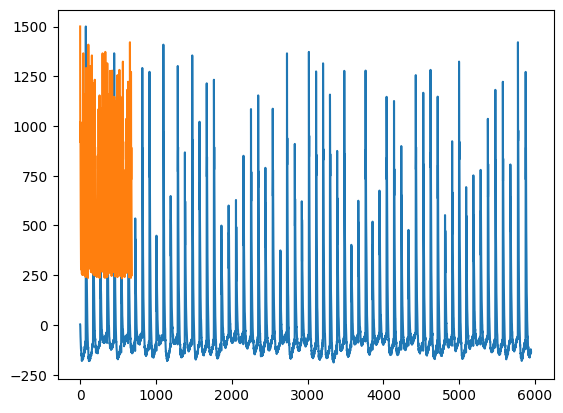

In [ ]:
print(np.std(test3))
test3 = np.array(test3[50:])
# sos = sig.butter(6, [1, 35], btype='bandpass', fs=100, output='sos')
# test3 = sig.sosfiltfilt(sos, test3)
plt.plot(test3)
plt.plot(test3[test3 > np.mean(test3) + np.std(test3)])

In [ ]:
test5 = [0.96, 0.96, 0.94, 0.92, 0.92, 0.94, 0.92, 0.92, 0.93, 0.95, 0.92, 0.91, 0.96, 0.94, 0.94, 0.97, 0.96, 0.95, 0.95, 0.99, 0.95, 0.97, 0.99, 0.99, 0.95, 0.95, 0.97, 0.97, 0.91, 1.03, 0.92, 0.94, 0.95, 0.92, 0.91, 0.95, 0.94, 0.93, 0.92, 0.96, 0.92, 0.91, 0.94, 0.98, 0.96, 0.95, 0.96, 0.99, 0.96, 0.94, 0.97, 0.94, 0.91, 0.94, 0.95, 0.96, 0.95, 0.99, 0.99, 0.99, 1.00, 1.02]
print(len(test5))

62
